In [1]:
import os
import glob
import json
import h5py
import numpy as np
import pandas as pd
from collections import defaultdict

In [2]:
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier, GradientBoostingRegressor, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.model_selection import RepeatedKFold, train_test_split, ParameterGrid, RepeatedStratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import (
    f1_score,
    cohen_kappa_score,
    precision_score,
    recall_score,
    confusion_matrix,
    r2_score
)
from scipy.stats import pearsonr, linregress, kurtosis, skew

import matplotlib.pyplot as plt
import matplotlib.colors as cl
import seaborn as sns
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib
sns.set_context("paper")
sns.set_style('whitegrid')
matplotlib.rcParams['font.size'] = 10
matplotlib.rcParams['font.family'] = 'sans-serif'

In [ ]:
# Functions to extract summary features from the AcceleRest predictions

def get_summary_stats(signal, signal_name, results):
    results[f'Mean {signal_name}'] = np.mean(signal)
    results[f'{signal_name} Var'] = np.var(signal)
    results[f'Max {signal_name}'] = np.max(signal)
    results[f'Min {signal_name}'] = np.min(signal)
    p10, p25, med, p75, p90 = np.percentile(signal, [10, 25, 50, 75, 90])
    results[f'{signal_name} P10'] = p10
    results[f'{signal_name} P25'] = p25
    results[f'{signal_name} Median'] = med
    results[f'{signal_name} P75'] = p75
    results[f'{signal_name} P90'] = p90
    results[f'{signal_name} Kurtosis'] = kurtosis(signal, bias=True)
    results[f'{signal_name} Skew'] = skew(signal, bias=True)
    return results

def get_apnea_features_3c(subject_path):
    scores = np.load(os.path.join(subject_path, 'soft_preds.npy'))
    preds = scores.argmax(axis=-1)
    results = {}
    results['HAR'] = (preds == 1).sum()/len(preds)
    results['OAR'] = (preds == 2).sum()/len(preds)
    re = np.logical_or(preds == 1, preds == 2)
    results['RER'] = re.mean() # N events/total recording time
    results['RETCR'] = np.diff(re).mean() # Threshold crossing rate
    re_p = scores[:, 1:].sum(-1)
    results = get_summary_stats(re_p, 'REP', results)
    return results

def get_apnea_features_2c(subject_path):
    scores = np.load(os.path.join(subject_path, 'soft_preds.npy'))
    preds = scores.argmax(axis=-1)
    results = {}
    re = preds == 1
    results['RER'] = re.mean()
    results['RETCR'] = np.diff(re).mean()
    # results['RE (N)'] = (p).sum()/len(preds)
    re_p = scores[:, 1]
    results = get_summary_stats(re_p, 'REP', results)
    return results

def get_apnea_features_reg(subject_path):
    preds = np.load(os.path.join(subject_path, 'preds.npy'))
    results = {}
    results = get_summary_stats(preds, 'RER', results)
    return results

def get_sleep_features(ss_results_path):
    ss_targets = np.load(os.path.join(ss_results_path, 'targets.npy'))
    ss_scores = np.load(os.path.join(ss_results_path, 'soft_preds.npy'))
    ss_preds = ss_scores.argmax(-1) 
    results = {}
    ss_label_map = {
        0: 'Deep',
        1: 'Light',
        2: 'REM',
        3: 'Wake',
        -9: 'Missing',
    }
    for k in range(ss_scores.shape[-1]):
        stage = ss_label_map[k]
        results[f'{stage} (%)'] = (ss_preds == k).sum()/len(ss_preds)
        results[f'{stage} (Pr)'] = ss_scores[:, k].mean()
        results = get_summary_stats(ss_scores[:, k], f'{stage} (Pr)', results)

    results[f'Sleep (%)'] = sum([(ss_preds == k).sum() for k in [0,1,2]])/len(ss_preds)
    results[f'Sleep (Pr)'] = ss_scores[:, :-1].sum(-1).mean()
    results = get_summary_stats(ss_scores[:, :-1].sum(-1), 'Sleep (Pr)', results)
    tm = get_state_transitions(ss_preds, ss_scores.shape[-1])
    for fro, to in np.ndindex(tm.shape):
        results[f'{ss_label_map[fro]} → {ss_label_map[to]}'] = tm[fro, to]
    return results
    
def get_state_transitions(preds, n_classes):
    fro = preds[:-1]
    to = preds[1:]
    counts = np.zeros((n_classes, n_classes))
    np.add.at(counts, (fro, to), 1)
    probs = counts / (counts.sum(axis=1, keepdims=True) + 1e-3)
    return probs

def get_apnea_sleep_interactions(apnea_path, ss_path):
    apnea_scores = np.load(os.path.join(apnea_path, 'soft_preds.npy'))
    apnea_preds = apnea_scores.argmax(-1)

    ss_scores = np.load(os.path.join(ss_path, 'soft_preds.npy'))
    ss_preds = ss_scores.argmax(-1)
    ss_label_map = {
        0: 'Deep',
        1: 'Light',
        2: 'REM',
        3: 'Wake',
        -9: 'Missing',
    }
    results = {}
    for k in range(ss_scores.shape[-1]):
        # RER = Respiratory event rate
        # AREP = Average Respiratory Event Probablitiy
        # REPC = Respiratory event probablility correaltion
        stage = ss_label_map[k]
        stage_epochs = ss_preds == k
        if (stage_epochs).sum() > 0:
            results[f'{stage} RER'] = (apnea_preds[stage_epochs] == 1).sum() / (stage_epochs).sum()
            results[f'{stage} Mean REP'] = apnea_scores[stage_epochs, 1].mean()
        else:
            results[f'{stage} RER'] = np.nan
            results[f'{stage} Mean REP'] = np.nan
        results[f'{stage} REP Corr'] = np.corrcoef(ss_scores[:,k], apnea_scores[:, 1])[0,1]

        # Get indeces 2 epochs beofre and 1 epoch after onsets and offsets
        onsets = np.argwhere(np.diff(stage_epochs.astype(int)) == 1)
        onsets = np.concatenate([onsets, onsets-1, onsets-2, onsets+1])
        onsets = onsets[np.logical_and(onsets > 0, onsets < len(ss_preds))]
        results[f'{stage} Onset REP'] = apnea_scores[onsets, 1].mean()

        offsets = np.argwhere(np.diff(stage_epochs.astype(int)) == -1)
        offsets = np.concatenate([offsets, offsets-1, offsets-2, offsets+1])
        offsets = offsets[np.logical_and(offsets > 0, offsets < len(ss_preds))]
        results[f'{stage} Offset REP'] = apnea_scores[offsets, 1].mean()
    
    sleep_epochs = ss_preds != 3
    results[f'Sleep RER'] = (apnea_preds[sleep_epochs] == 1).sum() / (sleep_epochs).sum()    
    results[f'Sleep Mean REP'] = apnea_scores[sleep_epochs, 1].mean()
    results[f'Sleep REP Corr'] = np.corrcoef(ss_scores[:,:3].sum(-1), apnea_scores[:, 1])[0,1]
    return results


In [4]:
experiments = {
    'Three-Class': {
        'LSTM-C': '/oak/stanford/groups/mignot/projects/actigraphy_fm/results/bwm_mae_lstmc_apnea_internal',
        'Linear': '/oak/stanford/groups/mignot/projects/actigraphy_fm/results/bwm_mae_apnea_internal',
    },
    'Two-Class': {
        'LSTM-C': '/oak/stanford/groups/mignot/projects/actigraphy_fm/results/bwm_mae_lstmc_apnea_2c_internal',
        'Linear': '/oak/stanford/groups/mignot/projects/actigraphy_fm/results/mae_bwm_apnea_2c_internal',
    },
    # 'Precision': {
    #     'LSTM-C': '/oak/stanford/groups/mignot/projects/actigraphy_fm/results/bwm_mae_lstmc_apnea_wa_internal',
    #     'Linear': '/oak/stanford/groups/mignot/projects/actigraphy_fm/results/bwm_mae_apnea_wa_internal',
    # },
    # 'Regression': {
    #     'LSTM-C': '/oak/stanford/groups/mignot/projects/actigraphy_fm/results/bwm_mae_lstmc_apnea_reg_internal',
    #     'Linear': '/oak/stanford/groups/mignot/projects/actigraphy_fm/results/bwm_mae_apnea_reg_internal',
    # },
    # 'Sleep Stages': {
    #     'LSTM-C': '/oak/stanford/groups/mignot/projects/actigraphy_fm/results/bwm_mae_lstmc_internal',
    #     'Linear': '/oak/stanford/groups/mignot/projects/actigraphy_fm/results/bwm_mae_internal',
    # }
}
experiments_final = {
    'Two-Class': {
        'Test set': '/oak/stanford/groups/mignot/projects/actigraphy_fm/results/mae_bwm_apnea_2c_internal',
        'Train set': '/oak/stanford/groups/mignot/projects/actigraphy_fm/results/mae_bwm_apnea_2c_internal_train',
        'External test': '/oak/stanford/groups/mignot/projects/actigraphy_fm/results/mae_bwm_apnea_2c_external',
    },
    'Sleep Stages': {
        'Test set': '/oak/stanford/groups/mignot/projects/actigraphy_fm/results/bwm_mae_internal',
        'Train set': '/oak/stanford/groups/mignot/projects/actigraphy_fm/results/bwm_mae_internal_train',
        'External test': '/oak/stanford/groups/mignot/projects/actigraphy_fm/results/bwm_mae_external'
    },
}

In [ ]:
# Function to exctract and structure results from the datasets
def get_results(experiments: dict, interactions: str = None):
    data_paths = {
        'tbi': '/oak/stanford/groups/mignot/projects/actigraphy_fm/data/tbi/',
        'amazfit': '/oak/stanford/groups/mignot/projects/actigraphy_fm/data/amazfit/',
        'dreamt': '/oak/stanford/groups/mignot/projects/actigraphy_fm/data/dreamt/',
        'stages': '/oak/stanford/groups/mignot/projects/actigraphy_fm/data/stages/',
    }

    results_super = {}
    for exp_name, model_dict in experiments.items():
        for model_name, results_dir in model_dict.items():
            results_super[f'{exp_name} {model_name}'] = defaultdict(list)
            if interactions is not None and exp_name != interactions:
                results_super[f'{exp_name} - {interactions} {model_name}'] = defaultdict(list)
                interact_base = experiments[interactions][model_name]
            
            for dataset in os.scandir(results_dir):
                if os.path.basename(dataset) not in data_paths.keys():
                    continue
                for sub_dir in os.scandir(dataset):
                    results_super[f'{exp_name} {model_name}']['subject'].append(os.path.basename(sub_dir))
                    results_super[f'{exp_name} {model_name}']['dataset'].append(os.path.basename(dataset))

                    # Get subject AHI from data file
                    sub_h5 = data_paths[os.path.basename(dataset)] + os.path.basename(sub_dir) + '.h5'
                    with h5py.File(sub_h5, 'r') as f:
                        results_super[f'{exp_name} {model_name}']['AHI'].append(f.attrs['ahi'])
                    
                    # Get apnea / sleep stage estimation summary features from model outputs
                    if exp_name in ['Three-Class', 'Precision']:
                        features = get_apnea_features_3c(sub_dir.path)
                    elif exp_name == 'Two-Class':
                        features = get_apnea_features_2c(sub_dir.path)
                    elif exp_name == 'Regression':
                        features = get_apnea_features_reg(sub_dir.path)
                    elif exp_name == 'Sleep Stages':
                        features = get_sleep_features(sub_dir.path)
                    
                    for feature, val in features.items():
                        results_super[f'{exp_name} {model_name}'][feature].append(val)
                    
                    if interactions is not None and exp_name != interactions:
                        interact_path = os.path.join(interact_base, os.path.basename(dataset), os.path.basename(sub_dir))
                        interaction_features = get_apnea_sleep_interactions(sub_dir.path, interact_path)
                        for feature, val in interaction_features.items():
                            results_super[f'{exp_name} - {interactions} {model_name}'][feature].append(val)
                        
                        results_super[f'{exp_name} - {interactions} {model_name}']['subject'].append(os.path.basename(sub_dir))
                        results_super[f'{exp_name} - {interactions} {model_name}']['dataset'].append(os.path.basename(dataset))

            results_super[f'{exp_name} {model_name}'] = pd.DataFrame(results_super[f'{exp_name} {model_name}'])
            if interactions is not None and exp_name != interactions:
                results_super[f'{exp_name} - {interactions} {model_name}'] = pd.DataFrame(results_super[f'{exp_name} - {interactions} {model_name}'])
    return results_super

In [6]:
results_super = get_results(experiments)
results_super_train = {}
results_super_test = {}
for model_name, results in results_super.items():
    results = results.sort_values('subject')

    bins = [0, 5, 15, 30, np.inf]
    OSA_sev = np.digitize(results['AHI'], bins=bins, right=False) - 1
    results['OSA severity'] = OSA_sev
    dset_train, dset_test = train_test_split(
        results, 
        test_size=0.4, train_size=0.6, stratify=OSA_sev, random_state=0
    )
    results_super_train[model_name] = dset_train.reset_index(drop=True)
    results_super_test[model_name] = dset_test.reset_index(drop=True)

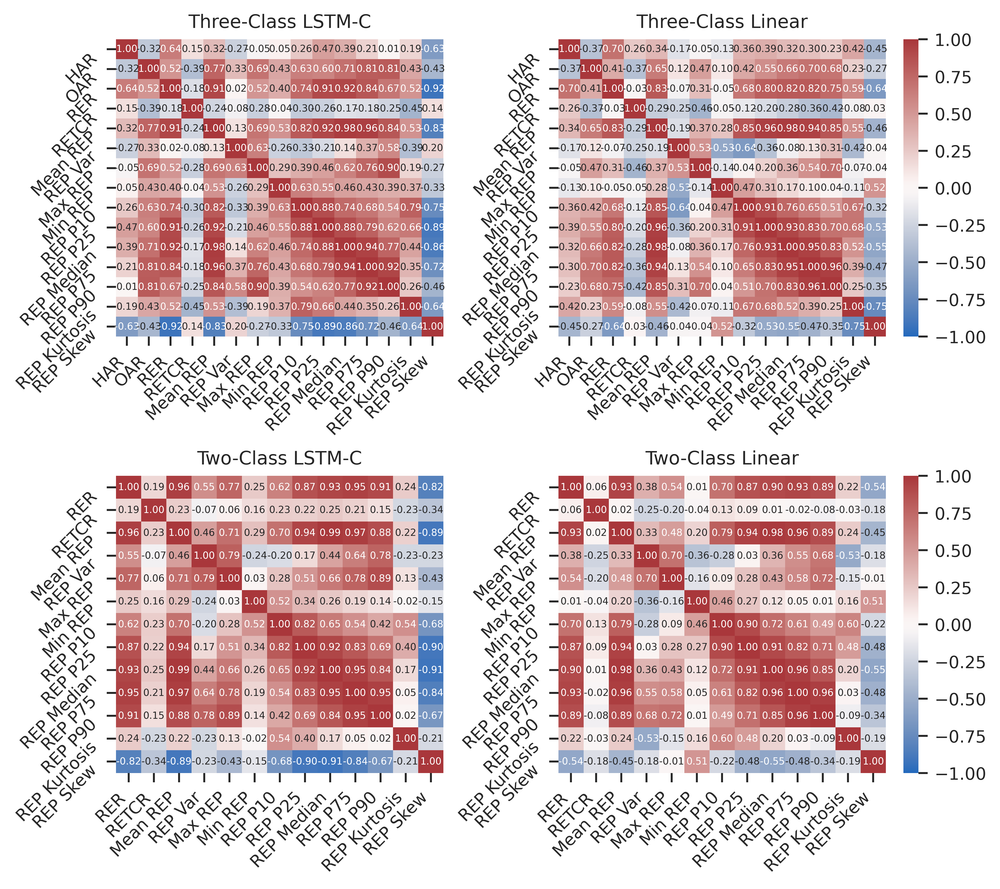

In [7]:
sns.set_context("paper")
sns.set_style('ticks')
matplotlib.rcParams['font.size'] = 5
matplotlib.rcParams['font.family'] = 'sans-serif'

# Raw feature correlations
fig, axes = plt.subplots(len(results_super.keys())//2,2,dpi=600, figsize=(7.1,6.3), layout='constrained')
axes = axes.ravel()
for i, (model_name, results) in enumerate(results_super_train.items()):
    # ahi = results.loc[:, 'AHI']
    if 'Sleep Stages' in model_name:
        continue
    features = results.drop(columns=['subject', 'dataset', 'AHI', 'OSA severity'])
    ax = sns.heatmap(features.corr(), ax=axes[i], cmap='vlag', annot=True,  fmt=".2f", vmin=-1, vmax=1, cbar=i%2)
    ax.set_title(model_name)
    ax.tick_params(rotation = 45)
    for label in ax.get_xticklabels():
        label.set_horizontalalignment('right')
    for label in ax.get_yticklabels():
        label.set_verticalalignment('top')
plt.show()

# fig, axes = plt.subplots(2,1,dpi=600, figsize=(7,10), layout='constrained')
# axes = axes.ravel()
# i = 0
# for model_name, results in results_super_train.items():
#     # ahi = results.loc[:, 'AHI']
#     if 'Sleep Stages' not in model_name:
#         continue
#     features = results.drop(columns=['subject', 'dataset', 'AHI', 'OSA severity'])
#     ax = sns.heatmap(features.corr(), ax=axes[i], cmap='vlag', annot=True,  fmt=".2f", vmin=-1, vmax=1, cbar=i%2)
#     ax.set_title(model_name)
#     ax.tick_params(rotation = 45)
#     for label in ax.get_xticklabels():
#         label.set_horizontalalignment('right')
#     for label in ax.get_yticklabels():
#         label.set_verticalalignment('top')
#     i += 1
plt.show()

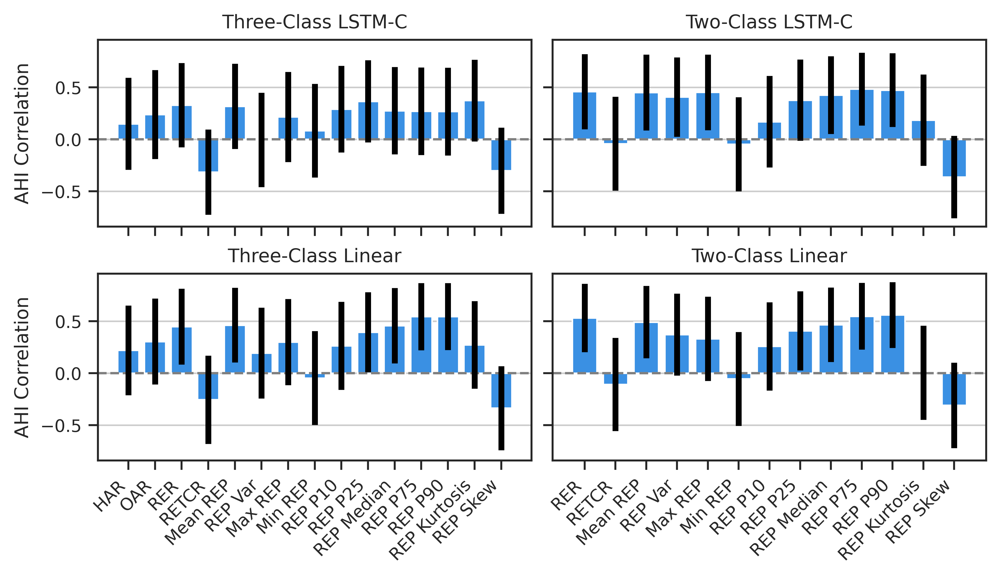

In [7]:
sns.set_context("paper")
sns.set_style('ticks')
matplotlib.rcParams['font.size'] = 5
matplotlib.rcParams['font.family'] = 'sans-serif'

# Feature AHI correlations
fig, axes = plt.subplots(len(results_super.keys())//2,2,dpi=600, figsize=(7,4), layout='constrained',sharey=True, sharex='col')
axes = axes.ravel()[[0,2,1,3]]
for i, (model_name, results) in enumerate(results_super_train.items()):
    if 'Sleep Stages' in model_name:
        continue
    ahi = results.loc[:, 'AHI']
    features = results.drop(columns=['subject', 'dataset', 'AHI', 'OSA severity'])
    df = []
    for feature_name in features.columns:
        feature = results.loc[:, feature_name]
        ahi_ = ahi[~feature.isna()]
        feature = feature[~feature.isna()]
        personr_res = pearsonr(ahi_, feature)
        ci_low, ci_high = personr_res.confidence_interval(.95)
        stat, p = personr_res
        df.append([feature_name, stat, (ci_high-ci_low), p])
    
    df = pd.DataFrame(df, columns=['feature', 'AHI Correlation', 'ci', 'p'])
    ax = sns.barplot(data=df, x='feature', y='AHI Correlation', color='dodgerblue', ax=axes[i])
    ax.axhline(0,color='gray', ls='--')
    ax.grid(axis='y')
    ax.errorbar(data=df, x='feature', y='AHI Correlation', yerr='ci', ls='', lw=3, color='black')
    ax.tick_params('x',rotation = 45)
    ax.set_title(model_name)
    for label in ax.get_xticklabels():
        label.set_horizontalalignment('right')
    ax.set_xlabel('')
    # if i < 4:
    #     ax.tick_params('x', labelbottom=False)   

plt.show()

# fig, axes = plt.subplots(6,2,dpi=600, figsize=(7,7), layout='constrained',sharey=True)
# for model_name, results in results_super_train.items():
#     if 'Sleep Stages' not in model_name:
#         continue
#     ahi = results.loc[:, 'AHI']
#     features = results.drop(columns=['subject', 'dataset', 'AHI', 'OSA severity'])
#     df = []
#     for feature_name in features.columns:
#         feature = results.loc[:, feature_name]
#         ahi_ = ahi[~feature.isna()]
#         feature = feature[~feature.isna()]
#         personr_res = pearsonr(ahi_, feature)
#         ci_low, ci_high = personr_res.confidence_interval(.95)
#         stat, p = personr_res
#         if '→' in feature_name:
#             axis = 5
#         elif 'Wake' in feature_name:
#             axis = 0
#         elif 'Light' in feature_name:
#             axis = 1
#         elif 'Deep' in feature_name:
#             axis = 2
#         elif 'REM' in feature_name:
#             axis = 3
#         elif 'Sleep' in feature_name:
#             axis = 4

#         df.append([feature_name, stat, (ci_high-ci_low), p, axis])
#     df = pd.DataFrame(df, columns=['feature', 'Pearson R', 'ci', 'p', 'ax'])
    
#     for row in df['ax'].unique():
#         col = 0 if 'LSTM' in model_name else 1
#         ax_df = df[df['ax']==row]
#         ax = sns.barplot(data=ax_df, x='feature', y='Pearson R', color='dodgerblue', ax=axes[row, col])
#         ax.errorbar(data=ax_df, x='feature', y='Pearson R', yerr='ci', ls='', lw=1, color='black')
#         # ax.axhline(0,color='gray', ls='--')
#         ax.grid(axis='y')
#         ax.tick_params('x',rotation = 45)
#         for label in ax.get_xticklabels():
#             label.set_horizontalalignment('right')
#         ax.set_xlabel('')
#         if i == 0:
#             ax.set_title(model_name)

# plt.show()


Three-Class LSTM-C, r2=0.03 ± 0.19
Three-Class Linear, r2=0.25 ± 0.23
Two-Class LSTM-C, r2=0.22 ± 0.24
Two-Class Linear, r2=0.28 ± 0.24


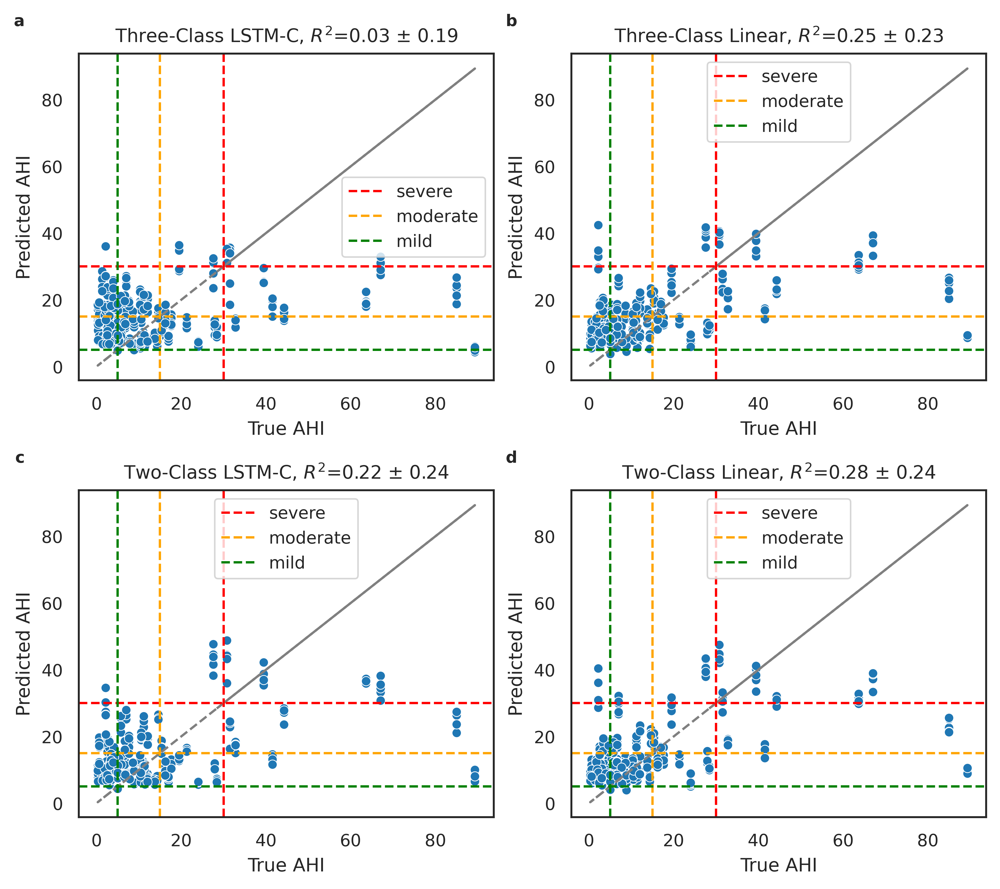

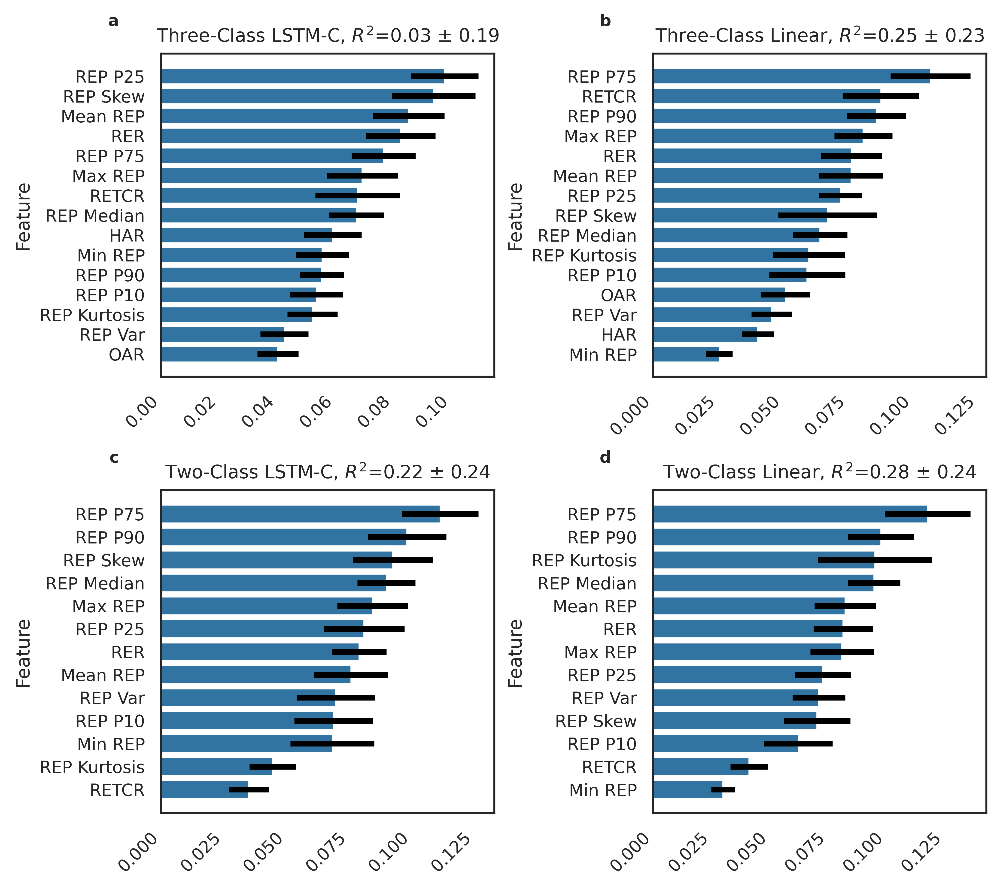

In [9]:
sns.set_context("paper")
sns.set_style('white')
matplotlib.rcParams['font.size'] = 7
matplotlib.rcParams['font.family'] = 'sans-serif'

rf = RandomForestRegressor(
    n_estimators=250,
    max_depth=10, # Max depth to grow trees too
    min_samples_split=3, # Min number of samples required to split an internal node
    min_samples_leaf=1, # Min samples required at leaf nodes (smoothing)
    max_features=3,#'sqrt', # Max features considere at each split
    max_samples=0.3, # Max number of samples used to grow each tree
    random_state=0,
    n_jobs=-1,
)
# rf = LinearRegression(positive=True, n_jobs=-1)
rkf = RepeatedStratifiedKFold(n_splits=5, n_repeats=5, random_state=0)

fig, axes = plt.subplots(len(results_super.keys())//2,2,dpi=600, figsize=(7.1,6.3), layout='constrained',sharey=False)
axes = axes.ravel()
fig2, axes2 = plt.subplots(len(results_super.keys())//2,2,dpi=600, figsize=(7.1,6.3), layout='constrained',sharey=False)
axes2 = axes2.ravel()
for i, (model_name, results) in enumerate(results_super_train.items()):
    r2 = []
    imp = []
    y_hat_all = []
    y_all = []
    for train_idx, test_idx in rkf.split(results['OSA severity'],results['OSA severity']):
        y_train = results.loc[train_idx, 'AHI']
        y_test = results.loc[test_idx, 'AHI']
        x_train = results.drop(columns=['subject', 'dataset', 'AHI', 'OSA severity']).loc[train_idx,:]
        x_test = results.drop(columns=['subject', 'dataset', 'AHI', 'OSA severity']).loc[test_idx,:]
        
        # Fit RF model
        rf = rf.fit(x_train, y_train)
        
        # Predict and inverse transform
        y_hat = rf.predict(x_test)

        # imp.append(rf.coef_)
        imp.append(rf.feature_importances_)
        y_hat_all.extend(y_hat)
        y_all.extend(y_test)
        r2.append(r2_score(y_test, y_hat))

    r2_mean, r2_std = np.mean(r2), np.std(r2)
    print(f'{model_name}, r2={round(r2_mean,2)} ± {round(r2_std,2)}')

    ## REGPLOT
    ax = sns.scatterplot(x=y_all, y=y_hat_all, ax=axes[i])
    # sns.regplot(x=y_all, y=y_hat_all, ax=ax, scatter=False, color='black')
    ax.plot(y_all, y_all, ls='--', color='grey')
    ax.set_title(f'{model_name}, $R^2$={round(r2_mean,2)} ± {round(r2_std,2)}')
    ax.set_xlabel('True AHI')
    ax.set_ylabel('Predicted AHI')

    ax.axhline(30, ls='--', color='red', label='severe')
    ax.axvline(30, ls='--', color='red')
    ax.axhline(15, ls='--', color='orange', label='moderate')
    ax.axvline(15, ls='--', color='orange')
    ax.axhline(5, ls='--', color='green', label='mild')
    ax.axvline(5, ls='--', color='green')
    ax.legend()
    

    ax.annotate(
        f'{chr(97+i)}',
        xy=(-0.15, 1.1), xycoords='axes fraction',
        xytext=(+0.5, -0.5), textcoords='offset fontsize',fontweight='bold',
        fontsize='large', verticalalignment='bottom', horizontalalignment='right',# fontfamily='verdana',
        bbox=dict(facecolor='none', edgecolor='none', pad=3.0)
    )

    ## Feature Importance
    df = {
        'Feature Importance': np.array(imp).mean(0),
        'Feature': x_train.columns,
        'SD': np.array(imp).std(0)
    }
    df = pd.DataFrame(df).sort_values('Feature Importance', ascending=False).iloc[:15,:] # Top 15 features
    ax = sns.barplot(df, y='Feature', x='Feature Importance', ax=axes2[i])
    ax.errorbar(data=df, y='Feature', x='Feature Importance', xerr='SD', ls='', lw=3, color='black')
    ax.tick_params('x',rotation = 45)
    for label in ax.get_xticklabels():
        label.set_horizontalalignment('right')
    ax.set_title(f'{model_name}, $R^2$={round(r2_mean,2)} ± {round(r2_std,2)}')
    ax.set_xlabel('')
    ax.annotate(
        f'{chr(97+i)}',
        xy=(-0.15, 1.1), xycoords='axes fraction',
        xytext=(+0.5, -0.5), textcoords='offset fontsize',fontweight='bold',
        fontsize='large', verticalalignment='bottom', horizontalalignment='right',# fontfamily='verdana',
        bbox=dict(facecolor='none', edgecolor='none', pad=3.0)
    )
plt.show()

Three-Class LSTM-C
F1: [0.5119909  0.35912959 0.02666667 0.46533333] +/- [0.13097688 0.12587759 0.13063945 0.27575835]
Recall: [0.584 0.368 0.02  0.54 ] +/- [0.21707551 0.20601618 0.09797959 0.31368774]
Precision: [0.49798413 0.41715007 0.08333333 0.44097222] +/- [0.15719567 0.15926484 0.2763854  0.26404875]

Three-Class Linear
F1: [0.61840315 0.52208885 0.01333333 0.62952381] +/- [0.12206908 0.18397566 0.06531973 0.24056623]
Recall: [0.62533333 0.58       0.02       0.68      ] +/- [0.16364732 0.26008546 0.09797959 0.27856777]
Precision: [0.6781645  0.5099596  0.01785714 0.6625    ] +/- [0.19307122 0.18520896 0.06438484 0.26252204]

Two-Class LSTM-C
F1: [0.46740826 0.16101676 0.05866667 0.58990476] +/- [0.12476044 0.14777999 0.16473008 0.23616482]
Recall: [0.55866667 0.16       0.06       0.68      ] +/- [0.21546436 0.15860503 0.16248077 0.27856777]
Precision: [0.42122944 0.17929894 0.10416667 0.58819444] +/- [0.10953843 0.14982264 0.25600429 0.25596943]

Two-Class Linear
F1: [0.61453

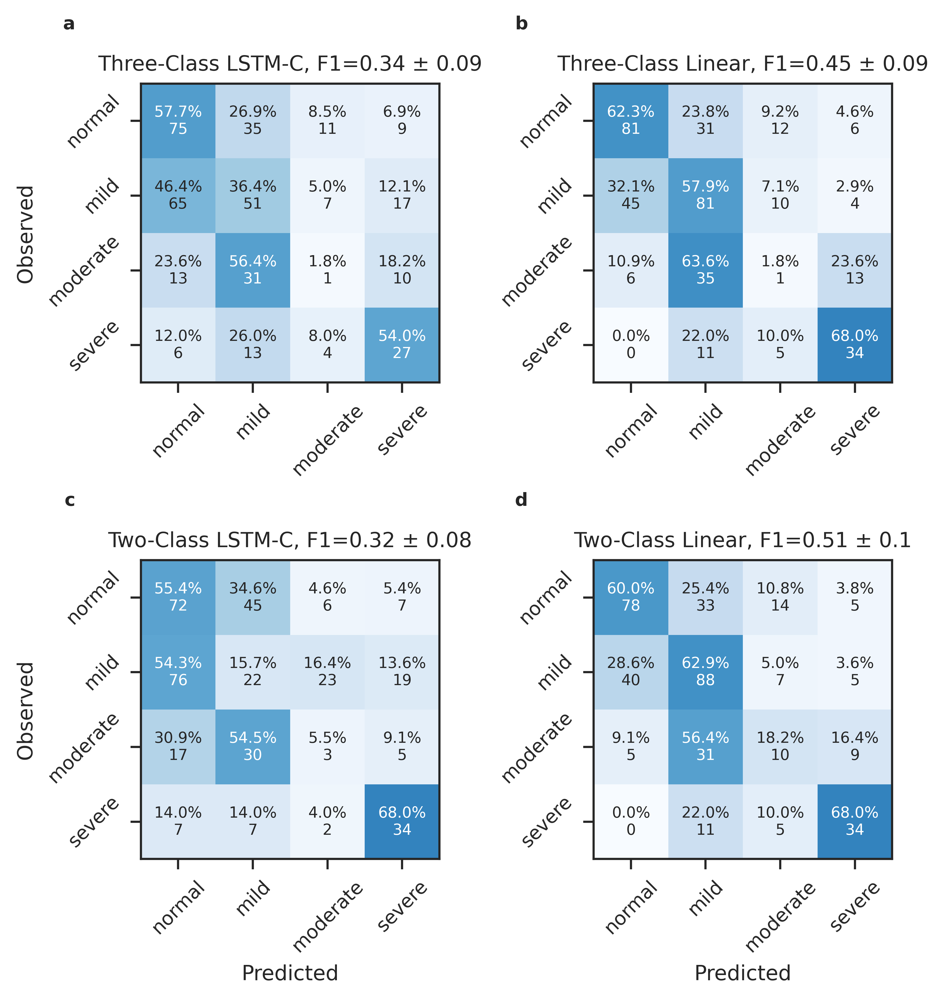

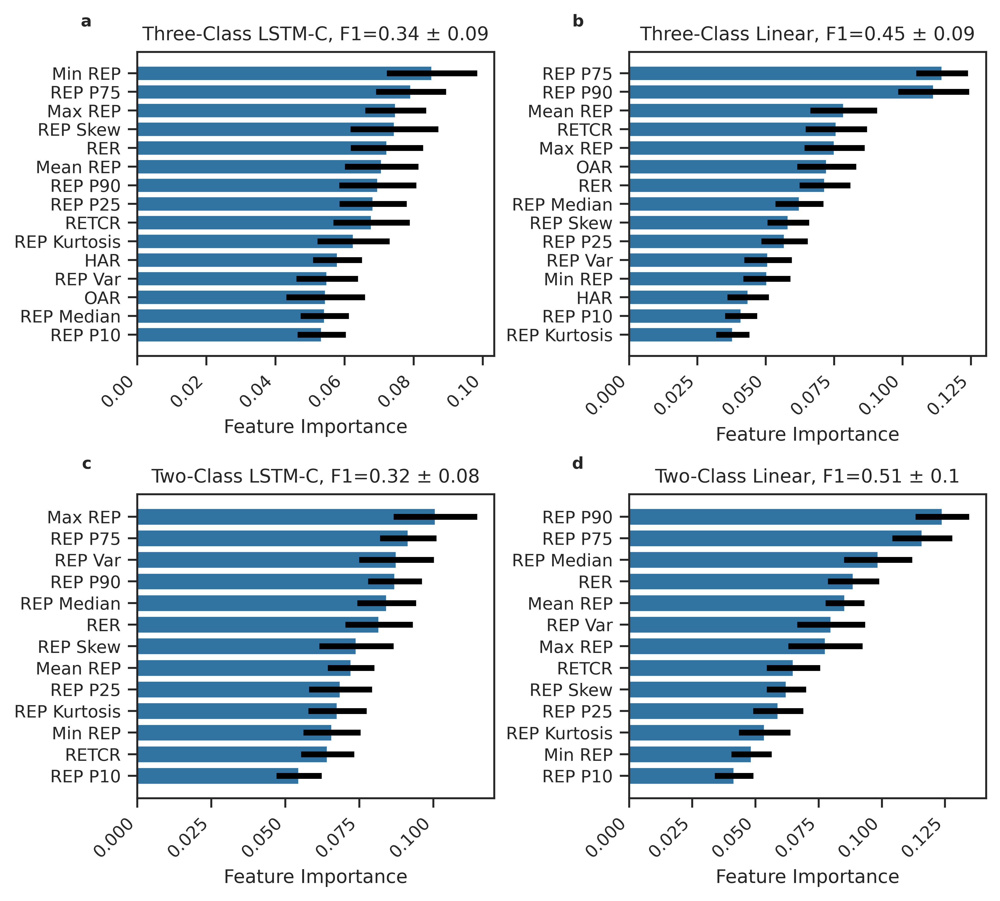

In [10]:
sns.set_context("paper")
sns.set_style('ticks')
matplotlib.rcParams['font.size'] = 7
matplotlib.rcParams['font.family'] = 'sans-serif'

rf = RandomForestClassifier(
    n_estimators=250,
    max_depth=10, # Max depth to grow trees too
    min_samples_leaf=3, # Min samples required at leaf nodes (smoothing)
    min_samples_split=3, # Min number of samples required to split an internal node
    max_features=3, #'sqrt', # Max features considere at each split
    max_samples=0.3, # Max number of samples used to grow each tree
    class_weight='balanced_subsample',
    random_state=0,
    n_jobs=-1,
)
rkf = RepeatedStratifiedKFold(n_splits=5, n_repeats=5, random_state=0)

ln = ["normal", "mild", "moderate", "severe"]

fig, axes = plt.subplots(len(results_super.keys())//2,2,dpi=600, figsize=(6,6.3), layout='constrained')#,sharey=True, sharex=True)
axes = axes.ravel()
fig2, axes2 = plt.subplots(len(results_super.keys())//2,2,dpi=600, figsize=(7,6.3), layout='constrained')#,sharey=False)
axes2 = axes2.ravel()
for i, (model_name, results) in enumerate(results_super_train.items()):
    imp = []
    y_hat_all = []
    y_all = []
    f1_all = []
    prec_all = []
    rec_all = []

    for train_idx, test_idx in rkf.split(results['OSA severity'], results['OSA severity']):
        y_train = results.loc[train_idx, 'OSA severity']
        y_test = results.loc[test_idx, 'OSA severity']
        
        x_train = results.drop(columns=['subject', 'dataset', 'AHI', 'OSA severity']).loc[train_idx,:]
        x_test = results.drop(columns=['subject', 'dataset', 'AHI', 'OSA severity']).loc[test_idx,:]
        # Fit RF model
        rf = rf.fit(x_train,y_train)
        
        # Predict and inverse transform
        y_hat = rf.predict(x_test)

        # imp.append(rf.coef_)
        imp.append(rf.feature_importances_)
        y_hat_all.extend(y_hat)
        y_all.extend(y_test)

        f1_all.append(f1_score(y_test, y_hat, average=None,zero_division=np.nan, labels=[0,1,2,3]))
        prec_all.append(precision_score(y_test, y_hat,average=None,zero_division=np.nan, labels=[0,1,2,3]))
        rec_all.append(recall_score(y_test, y_hat,average=None,zero_division=np.nan, labels=[0,1,2,3]))

    f1_mean, f1_std = np.nanmean(f1_all,axis=0), np.nanstd(f1_all,axis=0)
    f1_macro_std = np.nanmean(f1_all,axis=1).std()
    rec_mean, rec_std = np.nanmean(rec_all, axis=0), np.nanstd(rec_all, axis=0)
    prec_mean, prec_std = np.nanmean(prec_all, axis=0), np.nanstd(prec_all, axis=0)

    print(model_name)
    print(f'F1: {f1_mean} +/- {f1_std}')
    print(f'Recall: {rec_mean} +/- {rec_std}')
    print(f'Precision: {prec_mean} +/- {prec_std}\n')
    
    ## Confusion Matrix

    cm_abs = confusion_matrix(y_all, y_hat_all, normalize=None)
    cm_norm = cm_abs/cm_abs.sum(axis=1, keepdims=True)
    # Create combined annotation matrix
    annot = np.empty_like(cm_abs).astype(str)
    for r in range(cm_abs.shape[0]):
        for c in range(cm_abs.shape[1]):
            annot[r, c] = f"{cm_norm[r, c]*100:.1f}%\n{cm_abs[r, c]}"
    ax = sns.heatmap(
        cm_norm, annot=annot, fmt="", cmap="Blues", vmin=0, vmax=1, ax=axes[i],
        square=True, cbar=False, #linewidths=0.2, linecolor='black', clip_on=False,
        xticklabels=ln, yticklabels=ln,# annot_kws={'fontsize':7}
    )
    for _, spine in ax.spines.items():
        spine.set_visible(True)

    ax.tick_params(rotation = 45)
    if not i%2:
        ax.set_ylabel('Observed')
        for label in ax.get_yticklabels():
            label.set_verticalalignment('center')
    else:
        ax.set_ylabel('')
    ax.set_xlabel('')
    if i >= len(axes)-2:
        ax.set_xlabel('Predicted')
        for label in ax.get_xticklabels():
            label.set_horizontalalignment('center')

    ax.set_title(f'{model_name}, F1={round(f1_mean.mean(),2)} ± {round(f1_macro_std,2)}')
    
    ax.annotate(
        f'{chr(97+i)}',
        xy=(-0.25, 1.2), xycoords='axes fraction',
        xytext=(+0.5, -0.5), textcoords='offset fontsize',fontweight='bold',
        fontsize='large', verticalalignment='bottom', horizontalalignment='right',# fontfamily='verdana',
        bbox=dict(facecolor='none', edgecolor='none', pad=3.0)
    )
    ## Feature Importance
    df = {
        'Feature Importance': np.array(imp).mean(0),
        'Feature': x_train.columns,
        'SD': np.array(imp).std(0)
    }
    df = pd.DataFrame(df).sort_values('Feature Importance', ascending=False).iloc[:15, :] # Top 15 features
    ax = sns.barplot(df, y='Feature', x='Feature Importance', ax=axes2[i])
    ax.errorbar(data=df, y='Feature', x='Feature Importance', xerr='SD', ls='', lw=3, color='black')
    ax.tick_params('x',rotation = 45)
    for label in ax.get_xticklabels():
        label.set_horizontalalignment('right')
    ax.set_title(f'{model_name}, F1={round(f1_mean.mean(),2)} ± {round(f1_macro_std,2)}')
    ax.set_ylabel('')
    ax.annotate(
        f'{chr(97+i)}',
        xy=(-0.15, 1.1), xycoords='axes fraction',
        xytext=(+0.5, -0.5), textcoords='offset fontsize',fontweight='bold',
        fontsize='large', verticalalignment='bottom', horizontalalignment='right',# fontfamily='verdana',
        bbox=dict(facecolor='none', edgecolor='none', pad=3.0)
    )
plt.show()

In [ ]:
# Get datasets for final model testing
results_super = get_results(experiments_final, interactions = 'Sleep Stages')
apnea_test_results = results_super['Two-Class Test set'].copy().sort_values('subject')
sleep_test_results = results_super['Sleep Stages Test set'].copy().sort_values('subject')
interaction_test_results = results_super['Two-Class - Sleep Stages Test set'].copy().sort_values('subject')

apnea_train_results = results_super['Two-Class Train set'].copy().sort_values('subject')
sleep_train_results =  results_super['Sleep Stages Train set'].copy().sort_values('subject')
interaction_train_results = results_super['Two-Class - Sleep Stages Train set'].copy().sort_values('subject')

apnea_external_test_results = results_super['Two-Class External test'].copy().sort_values('subject')
sleep_external_test_results = results_super['Sleep Stages External test'].copy().sort_values('subject')
interaction_external_test_results = results_super['Two-Class - Sleep Stages External test'].copy().sort_values('subject')

bins = [0, 5, 15, 30, np.inf]
OSA_sev = np.digitize(apnea_test_results['AHI'], bins=bins, right=False) - 1
apnea_test_results['OSA severity'] = OSA_sev

apnea_val, apnea_test, sleep_val, sleep_test, interaction_val, interaction_test = train_test_split(
    apnea_test_results, sleep_test_results, interaction_test_results,
    test_size=0.4, train_size=0.6, stratify=OSA_sev, random_state=0
)

apnea_val = apnea_val.reset_index(drop=True)
apnea_test = apnea_test.reset_index(drop=True)

sleep_val = sleep_val.reset_index(drop=True)
sleep_test = sleep_test.reset_index(drop=True)

interaction_val = interaction_val.reset_index(drop=True)
interaction_test = interaction_test.reset_index(drop=True)

apnea_train_results['OSA severity'] = np.digitize(apnea_train_results['AHI'], bins=bins, right=False) - 1
apnea_external_test_results['OSA severity'] = np.digitize(apnea_external_test_results['AHI'], bins=bins, right=False) - 1


/tmp/ipykernel_9494/767993257.py:113: RuntimeWarning: Mean of empty slice.
  results[f'{stage} Onset REP'] = apnea_scores[onsets, 1].mean()
/home/groups/mignot/nielsl/environments/torch_surv/lib/python3.12/site-packages/numpy/_core/_methods.py:145: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)
/tmp/ipykernel_9494/767993257.py:118: RuntimeWarning: Mean of empty slice.
  results[f'{stage} Offset REP'] = apnea_scores[offsets, 1].mean()


In [13]:
len(apnea_val)

75

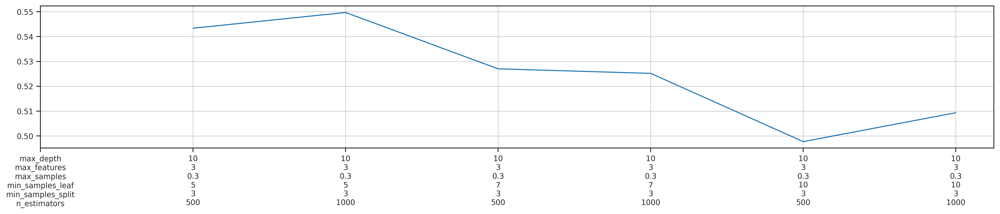

In [ ]:
# Grid search
sns.set_context("paper")
sns.set_style('ticks')
matplotlib.rcParams['font.size'] = 7
matplotlib.rcParams['font.family'] = 'sans-serif'

model_name = 'RE + Sleep'
ln = ["normal", "mild", "moderate", "severe"]
seed = 0
# Train on full training set vs only training-test
use_train = True
use_sleep_feat = True
use_interact = True

# Hyperparameter tuning
grid = ParameterGrid({
    'n_estimators': [500, 1000],#, 1000, 2000],
    'max_depth': [10],
    'min_samples_leaf': [5, 7, 10],
    'min_samples_split': [3],
    'max_samples': [0.3],
    'max_features': [3,],
})
rkf = RepeatedKFold(n_splits=5, n_repeats=5, random_state=seed)

gridsearch_out = []
performance_main = []
for params in grid:
    rf = RandomForestClassifier(
        **params,
        class_weight='balanced_subsample',
        random_state=seed,
        n_jobs=-1,
    )

    imp = []
    y_hat_all = []
    y_all = []
    f1_all = []
    prec_all = []
    rec_all = []

    for train_idx, test_idx in rkf.split(apnea_val):
        # Train on training split from test result outputs w. warm start
        y_train = apnea_val.loc[train_idx, 'OSA severity']
        x_train = apnea_val.drop(columns=['subject', 'dataset', 'AHI', 'OSA severity']).loc[train_idx,:]
        c_train = sleep_val.drop(columns=['subject', 'dataset', 'AHI']).loc[train_idx,:]
        interact_train = interaction_val.drop(columns=['subject', 'dataset']).loc[train_idx,:]

        if use_train:
            # Train on training set output
            y_train2 = apnea_train_results['OSA severity']
            x_train2 = apnea_train_results.drop(columns=['subject', 'dataset', 'AHI', 'OSA severity'])
            c_train2 = sleep_train_results.drop(columns=['subject', 'dataset', 'AHI'])
            interact_train2 = interaction_train_results.drop(columns=['subject', 'dataset'])

            y_train = pd.concat([y_train,y_train2])
            x_train = pd.concat([x_train,x_train2])
            c_train = pd.concat([c_train,c_train2])
            interact_train = pd.concat([interact_train, interact_train2])

        # Evaluate on test split from test result outputs
        y_test = apnea_val.loc[test_idx, 'OSA severity']
        x_test = apnea_val.drop(columns=['subject', 'dataset', 'AHI', 'OSA severity']).loc[test_idx,:]
        c_test = sleep_val.drop(columns=['subject', 'dataset', 'AHI']).loc[test_idx,:]
        interact_test = interaction_val.drop(columns=['subject', 'dataset']).loc[test_idx,:]

        if use_sleep_feat:
            x_train = pd.concat([x_train,c_train],axis=1)
            x_test = pd.concat([x_test,c_test],axis=1)
        
        if use_interact:
            x_train = pd.concat([x_train,interact_train],axis=1)
            x_test = pd.concat([x_test,interact_test],axis=1)    

        rf = rf.fit(x_train, y_train)
        
        # Predict and inverse transform
        y_hat = rf.predict(x_test)

        # imp.append(rf.coef_)
        imp.append(rf.feature_importances_)
        y_hat_all.extend(y_hat)
        y_all.extend(y_test)

        f1_all.append(f1_score(y_test, y_hat, average=None,zero_division=np.nan, labels=[0,1,2,3]))
        prec_all.append(precision_score(y_test, y_hat,average=None,zero_division=np.nan, labels=[0,1,2,3]))
        rec_all.append(recall_score(y_test, y_hat,average=None,zero_division=np.nan, labels=[0,1,2,3]))

    # f1_mean, f1_std = np.nanmean(f1_all,axis=0), np.nanstd(f1_all,axis=0)
    # rec_mean, rec_std = np.nanmean(rec_all, axis=0), np.nanstd(rec_all, axis=0)
    # prec_mean, prec_std = np.nanmean(prec_all, axis=0), np.nanstd(prec_all, axis=0)
    
    f1_macro_mean, f1_macro_std = np.nanmean(f1_all,axis=1).mean(), np.nanmean(f1_all,axis=1).std()
    rec_macro_mean, rec_macro_std = np.nanmean(rec_all,axis=1).mean(), np.nanmean(rec_all,axis=1).std()
    prec_macro_mean, prec_macro_std = np.nanmean(prec_all,axis=1).mean(), np.nanmean(prec_all,axis=1).std()

    performance = {
        'f1_macro': (f1_macro_mean, f1_macro_std),
        'recall_macro': (rec_macro_mean, rec_macro_std),
        'precision_macro': (prec_macro_mean, prec_macro_std)
    }
    gridsearch_out.append((params, performance))
    performance_main.append(f1_macro_mean)

plt.figure(dpi=300, figsize=(20,3))
plt.plot(performance_main)
plt.grid()
plt.xticks(np.arange(-1,len(gridsearch_out)),['\n'.join([str(val)  if i >=0 else str(key) for key, val in gridsearch_out[i][0].items()]) for i in range(-1, len(gridsearch_out))], rotation=0)
plt.show()

RE + Sleep + RE x Sleep
F1: [0.58568432 0.62742036 0.55       0.76666667] +/- [0.09427453 0.10897081 0.16329932 0.2       ]
Recall: [0.54       0.66666667 0.53333333 0.7       ] +/- [0.08       0.19321836 0.06666667 0.24494897]
Precision: [0.70571429 0.61428571 0.66666667 0.9       ] +/- [0.24637784 0.09979571 0.31622777 0.2       ]



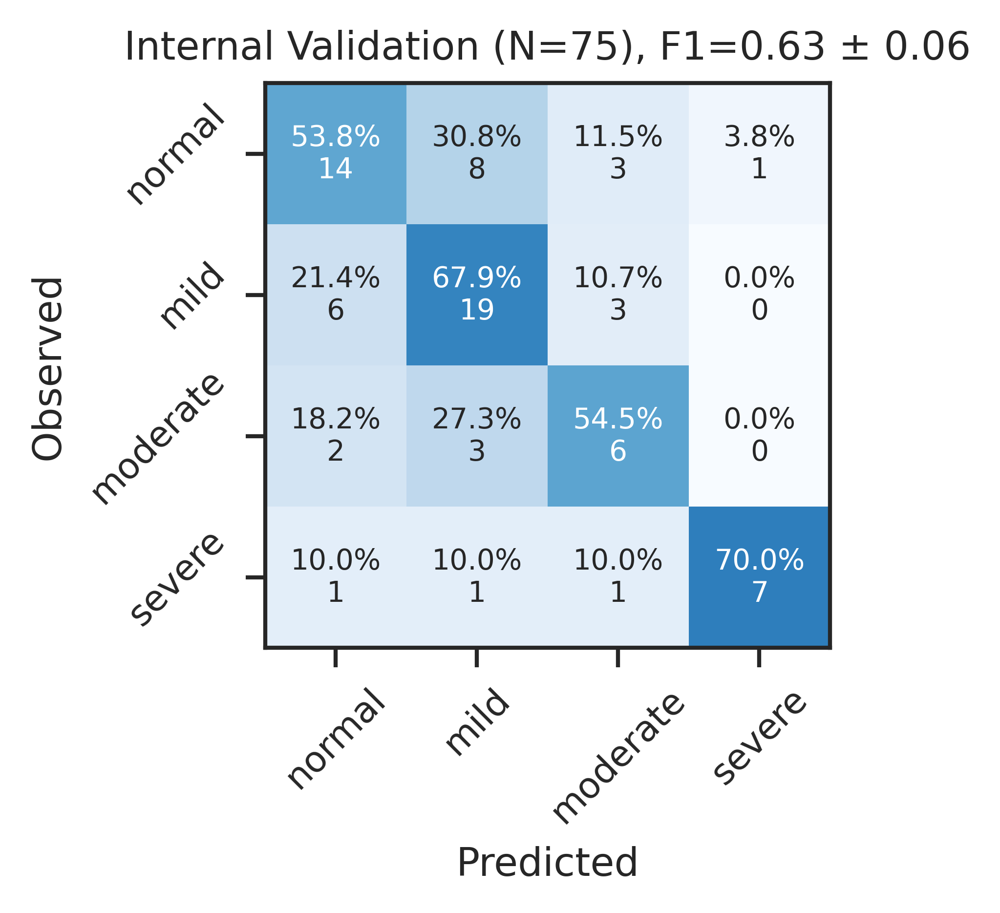

In [16]:
#Feature tests
sns.set_context("paper")
sns.set_style('ticks')
matplotlib.rcParams['font.size'] = 7
matplotlib.rcParams['font.family'] = 'sans-serif'

ln = ["normal", "mild", "moderate", "severe"]
seed = 0

rf = RandomForestClassifier(
    n_estimators=2000,
    max_depth=10, # At least 10 was important, more had no effect
    min_samples_leaf=5, # important in grid search, 5 was best # Min samples required at leaf nodes (smoothing)
    min_samples_split=3, # 1-3 found fine during gridsearch # Min number of samples required to split an internal node
    max_features=3, # Important duning gridsearch, 3 worked best # Max features considere at each split
    max_samples=0.3, # Important during gridsearch, 0.1-0.3 worked well # Max number of samples used to grow each tree
    class_weight='balanced_subsample',
    random_state=seed,
    n_jobs=-1,
)
# rkf = RepeatedKFold(n_splits=5, n_repeats=5, random_state=seed)
rkf = RepeatedStratifiedKFold(n_splits=5, n_repeats=1, random_state=seed)

fig, axes = plt.subplots(1,1,dpi=600, figsize=(3.5,3), layout='constrained')#,sharey=True, sharex=True)
axes = [axes]#.ravel()
# Train on full training set vs only training-test
for i, f in enumerate([('RE', 'Sleep', 'X')]):#('RE'), ('RE', 'Sleep'), ('RE', 'X'),
    use_train = True
    use_sleep_feat = 'Sleep' in f
    use_interact = 'X' in f
    model_name = 'RE'
    if use_sleep_feat:
        model_name +=  ' + Sleep'
    if use_interact:
        model_name +=  ' + RE x Sleep'

    imp = []
    y_hat_all = []
    y_all = []
    f1_all = []
    prec_all = []
    rec_all = []

    for train_idx, test_idx in rkf.split(apnea_val['OSA severity'], apnea_val['OSA severity']):
        # Train on val split from test result outputs
        y_train = apnea_val.loc[train_idx, 'OSA severity']
        x_train = apnea_val.drop(columns=['subject', 'dataset', 'AHI', 'OSA severity']).loc[train_idx,:]
        c_train = sleep_val.drop(columns=['subject', 'dataset', 'AHI']).loc[train_idx,:]
        interact_train = interaction_val.drop(columns=['subject', 'dataset']).loc[train_idx,:]

        if use_train:
            # Train on training set output
            y_train2 = apnea_train_results['OSA severity']
            x_train2 = apnea_train_results.drop(columns=['subject', 'dataset', 'AHI', 'OSA severity'])
            c_train2 = sleep_train_results.drop(columns=['subject', 'dataset', 'AHI'])
            interact_train2 = interaction_train_results.drop(columns=['subject', 'dataset'])

            y_train = pd.concat([y_train,y_train2])
            x_train = pd.concat([x_train,x_train2])
            c_train = pd.concat([c_train,c_train2])
            interact_train = pd.concat([interact_train, interact_train2])

        # Evaluate on val split from test result outputs
        y_test = apnea_val.loc[test_idx, 'OSA severity']
        x_test = apnea_val.drop(columns=['subject', 'dataset', 'AHI', 'OSA severity']).loc[test_idx,:]
        c_test = sleep_val.drop(columns=['subject', 'dataset', 'AHI']).loc[test_idx,:]
        interact_test = interaction_val.drop(columns=['subject', 'dataset']).loc[test_idx,:]

        if use_sleep_feat:
            x_train = pd.concat([x_train,c_train],axis=1)
            x_test = pd.concat([x_test,c_test],axis=1)
        
        if use_interact:
            x_train = pd.concat([x_train,interact_train],axis=1)
            x_test = pd.concat([x_test,interact_test],axis=1)    

        rf = rf.fit(x_train, y_train)
        
        # Predict and inverse transform
        y_hat = rf.predict(x_test)

        # imp.append(rf.coef_)
        imp.append(rf.feature_importances_)
        y_hat_all.extend(y_hat)
        y_all.extend(y_test)

        f1_all.append(f1_score(y_test, y_hat, average=None,zero_division=np.nan, labels=[0,1,2,3]))
        prec_all.append(precision_score(y_test, y_hat,average=None,zero_division=np.nan, labels=[0,1,2,3]))
        rec_all.append(recall_score(y_test, y_hat,average=None,zero_division=np.nan, labels=[0,1,2,3]))

    f1_mean, f1_std = np.nanmean(f1_all,axis=0), np.nanstd(f1_all,axis=0)
    f1_macro_std = np.nanmean(f1_all,axis=1).std()
    rec_mean, rec_std = np.nanmean(rec_all, axis=0), np.nanstd(rec_all, axis=0)
    prec_mean, prec_std = np.nanmean(prec_all, axis=0), np.nanstd(prec_all, axis=0)

    print(model_name)
    print(f'F1: {f1_mean} +/- {f1_std}')
    print(f'Recall: {rec_mean} +/- {rec_std}')
    print(f'Precision: {prec_mean} +/- {prec_std}\n')

    # axes = axes.ravel()

    ## Confusion Matrix
    cm_abs = confusion_matrix(y_all, y_hat_all, normalize=None)
    cm_norm = cm_abs/cm_abs.sum(axis=1, keepdims=True)
    # Create combined annotation matrix
    annot = np.empty_like(cm_abs).astype(str)
    for r in range(cm_abs.shape[0]):
        for c in range(cm_abs.shape[1]):
            annot[r, c] = f"{cm_norm[r, c]*100:.1f}%\n{cm_abs[r, c]}"
    ax = sns.heatmap(
        cm_norm, annot=annot, fmt="", cmap="Blues", vmin=0, vmax=1, ax=axes[i],
        square=True, cbar=False, #linewidths=0.2, linecolor='black', clip_on=False,
        xticklabels=ln, yticklabels=ln,# annot_kws={'fontsize':7}
    )
    for _, spine in ax.spines.items():
        spine.set_visible(True)

    ax.tick_params(rotation = 45)
    ax.set_ylabel('Observed')
    for label in ax.get_yticklabels():
        label.set_verticalalignment('center')
    ax.set_xlabel('Predicted')
    for label in ax.get_xticklabels():
        label.set_horizontalalignment('center')
    ax.set_title(f'Internal Validation (N={len(y_all)}), F1={round(f1_mean.mean(),2)} ± {round(f1_macro_std,2)}')

## All Feature Importance
feature_importance = {
    'Feature Importance': np.array(imp).mean(0),
    'Feature': x_train.columns,
    'SD': np.array(imp).std(0)
}
feature_importance = pd.DataFrame(feature_importance).sort_values('Feature Importance', ascending=False)


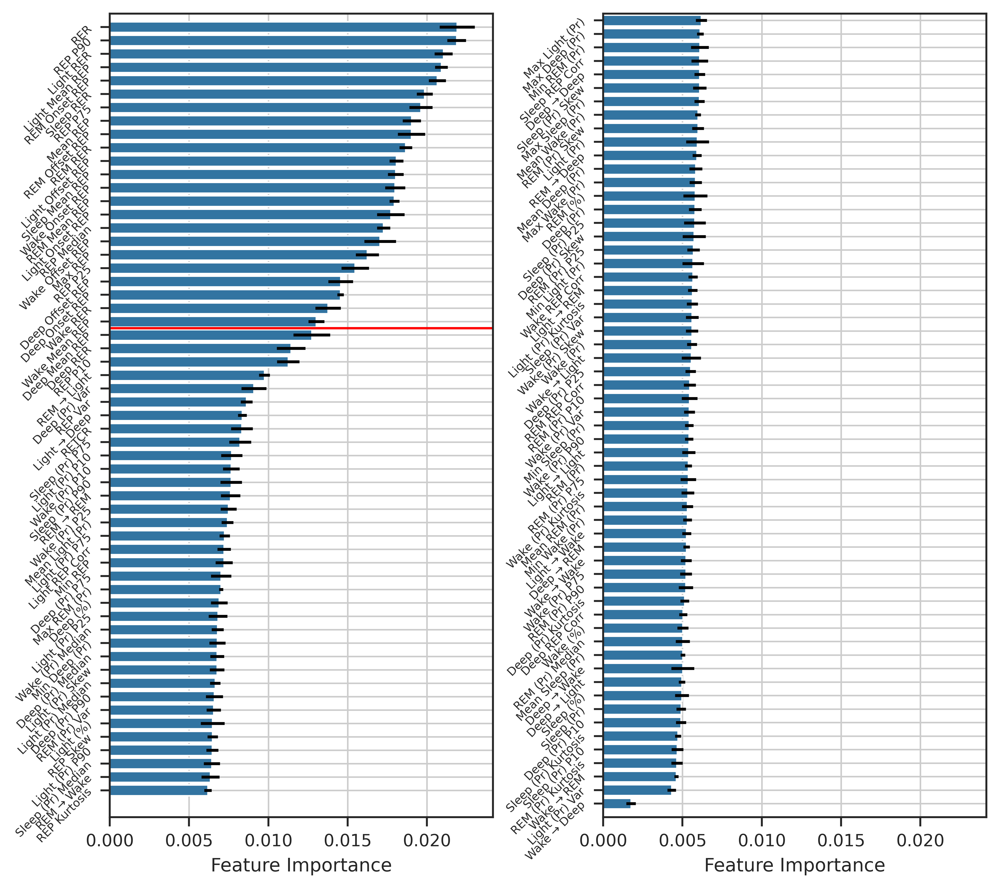

In [17]:
# Plot all feature importances
fig, axes = plt.subplots(1,2,dpi=600, figsize=(7.1,6.3), layout='constrained', sharex=True)
ax = sns.barplot(feature_importance.iloc[:len(feature_importance)//2], y='Feature', x='Feature Importance', ax=axes[0], edgecolor=None)
ax.errorbar(data=feature_importance.iloc[:len(feature_importance)//2], y='Feature', x='Feature Importance', xerr='SD', ls='', lw=1.5, color='black')
ax.tick_params('y',rotation = 45, labelsize=6)
for label in ax.get_yticklabels():
    label.set_horizontalalignment('right')
ax.set_ylim(len(feature_importance)//2+1, -1)
ax.set_ylabel('')
ax.axhline(22.5, color='red')
ax.grid()

ax = sns.barplot(feature_importance.iloc[len(feature_importance)//2:], y='Feature', x='Feature Importance', ax=axes[1], edgecolor=None)
ax.errorbar(data=feature_importance.iloc[len(feature_importance)//2:], y='Feature', x='Feature Importance', xerr='SD', ls='', lw=1.5, color='black')
ax.tick_params('y',rotation = 45, labelsize=6)
for label in ax.get_yticklabels():
    label.set_horizontalalignment('right')
ax.set_ylim(len(feature_importance)//2+1, -0.5)
ax.set_ylabel('')
ax.grid()

plt.show()

In [21]:
#Top feature tests
sns.set_context("paper")
sns.set_style('ticks')
matplotlib.rcParams['font.size'] = 7
matplotlib.rcParams['font.family'] = 'sans-serif'

ln = ["normal", "mild", "moderate", "severe"]
seed = 0

rf = RandomForestClassifier(
    n_estimators=2000,
    max_depth=10,
    min_samples_leaf=5, 
    min_samples_split=3, 
    max_features=3, 
    max_samples=0.3,
    class_weight='balanced_subsample',
    random_state=seed,
    n_jobs=-1,
)
# rkf = RepeatedKFold(n_splits=5, n_repeats=5, random_state=seed)
rkf = RepeatedStratifiedKFold(n_splits=5, n_repeats=1, random_state=seed)

# Train on full training set vs only training-test
f = ('RE', 'Sleep', 'X')
use_train = True
use_sleep_feat = 'Sleep' in f
use_interact = 'X' in f
model_name = 'RE'
if use_sleep_feat:
    model_name +=  ' + Sleep'
if use_interact:
    model_name +=  ' + RE x Sleep'

for n_features in [15,20,25,30,50,len(feature_importance)]:
    top_features = list(feature_importance.iloc[:n_features].Feature)

    imp = []
    y_hat_all = []
    y_all = []
    f1_test = []
    f1_train = []

    for train_idx, test_idx in rkf.split(apnea_val['OSA severity'], apnea_val['OSA severity']):
        # Train on val split from test result outputs
        y_train = apnea_val.loc[train_idx, 'OSA severity']
        x_train = apnea_val.drop(columns=['subject', 'dataset', 'AHI', 'OSA severity']).loc[train_idx,:]
        c_train = sleep_val.drop(columns=['subject', 'dataset', 'AHI']).loc[train_idx,:]
        interact_train = interaction_val.drop(columns=['subject', 'dataset']).loc[train_idx,:]

        if use_train:
            # Train on training set output
            y_train2 = apnea_train_results['OSA severity']
            x_train2 = apnea_train_results.drop(columns=['subject', 'dataset', 'AHI', 'OSA severity'])
            c_train2 = sleep_train_results.drop(columns=['subject', 'dataset', 'AHI'])
            interact_train2 = interaction_train_results.drop(columns=['subject', 'dataset'])

            y_train = pd.concat([y_train,y_train2])
            x_train = pd.concat([x_train,x_train2])
            c_train = pd.concat([c_train,c_train2])
            interact_train = pd.concat([interact_train, interact_train2])

        # Evaluate on val split from test result outputs
        y_test = apnea_val.loc[test_idx, 'OSA severity']
        x_test = apnea_val.drop(columns=['subject', 'dataset', 'AHI', 'OSA severity']).loc[test_idx,:]
        c_test = sleep_val.drop(columns=['subject', 'dataset', 'AHI']).loc[test_idx,:]
        interact_test = interaction_val.drop(columns=['subject', 'dataset']).loc[test_idx,:]

        if use_sleep_feat:
            x_train = pd.concat([x_train,c_train],axis=1)
            x_test = pd.concat([x_test,c_test],axis=1)
        
        if use_interact:
            x_train = pd.concat([x_train,interact_train],axis=1)
            x_test = pd.concat([x_test,interact_test],axis=1)    
            
        rf = rf.fit(x_train[top_features], y_train)
        
        # Predict and inverse transform
        y_hat_test = rf.predict(x_test[top_features])
        y_hat_train = rf.predict(x_train[top_features])


        # imp.append(rf.coef_)
        imp.append(rf.feature_importances_)
        y_hat_all.extend(y_hat)
        y_all.extend(y_test)

        f1_test.append(f1_score(y_test, y_hat_test, average='macro',zero_division=np.nan, labels=[0,1,2,3]))
        f1_train.append(f1_score(y_train, y_hat_train, average='macro',zero_division=np.nan, labels=[0,1,2,3]))
        
    f1_test, f1_test_std = np.nanmean(f1_test), np.nanstd(f1_test)
    f1_train, f1_train_std =  np.nanmean(f1_train), np.nanstd(f1_train)

    print(n_features)
    print(f'F1 train: {round(f1_train.mean(),3)} +/- {round(f1_train_std,3)}')
    print(f'F1 test: {round(f1_test.mean(),3)} +/- {round(f1_test_std,3)}\n')

    

15
F1 train: 0.61 +/- 0.006
F1 test: 0.502 +/- 0.075

20
F1 train: 0.608 +/- 0.007
F1 test: 0.463 +/- 0.105

25
F1 train: 0.633 +/- 0.005
F1 test: 0.435 +/- 0.127

30
F1 train: 0.636 +/- 0.007
F1 test: 0.421 +/- 0.116

50
F1 train: 0.67 +/- 0.009
F1 test: 0.489 +/- 0.09

117
F1 train: 0.72 +/- 0.004
F1 test: 0.64 +/- 0.055



/home/groups/mignot/nielsl/environments/torch_surv/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/groups/mignot/nielsl/environments/torch_surv/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


KeyError: "['Deep REPC', 'Light REPC'] not found in axis"

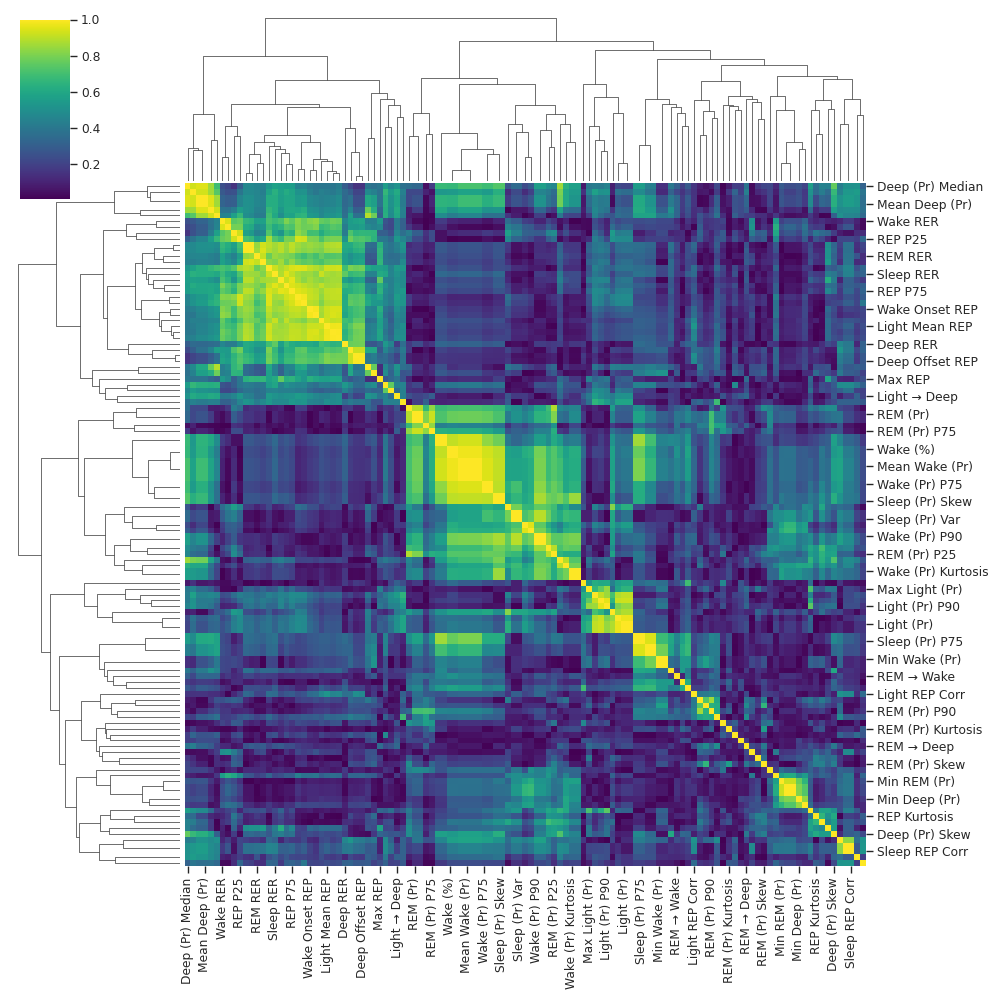

In [19]:
# Feature colinearity
sns.clustermap(x_train.corr().abs(), cmap='viridis')
high_corr_feats = np.argwhere(x_train.drop(columns=['Deep RER', 'Light RER', 'Deep REPC', 'Light REPC']).corr().abs() > 0.95)
off_diag = high_corr_feats[:,0] != high_corr_feats[:,1]
high_corr_feats = high_corr_feats[off_diag]
features = x_train.drop(columns=['Deep RER', 'Light RER', 'Deep REPC', 'Light REPC']).columns
feature_pairs = features[high_corr_feats[:,0]], features[high_corr_feats[:,1]]
feature_pairs
participants, npairs = np.unique(high_corr_feats.flatten(), return_counts=True)
winners, nwins = np.unique(np.array([pair[np.argmax(np.array(imp).mean(0)[pair])] for pair in high_corr_feats]) , return_counts = True)

winners, nwins, participants, npairs

F1 internal: [0.54545455 0.29411765 0.22222222 0.8       ]
Recall internal: [0.6        0.3125     0.18181818 0.75      ]
Precision internal: [0.5        0.27777778 0.28571429 0.85714286]

F1 external: [0.73333333 0.68965517 0.5        0.        ]
Recall external: [0.6875     0.71428571 0.5        0.        ]
Precision external: [0.78571429 0.66666667 0.5        0.        ]



Text(0.5, 1.0, 'Combined Test (N=85), F1=0.52')

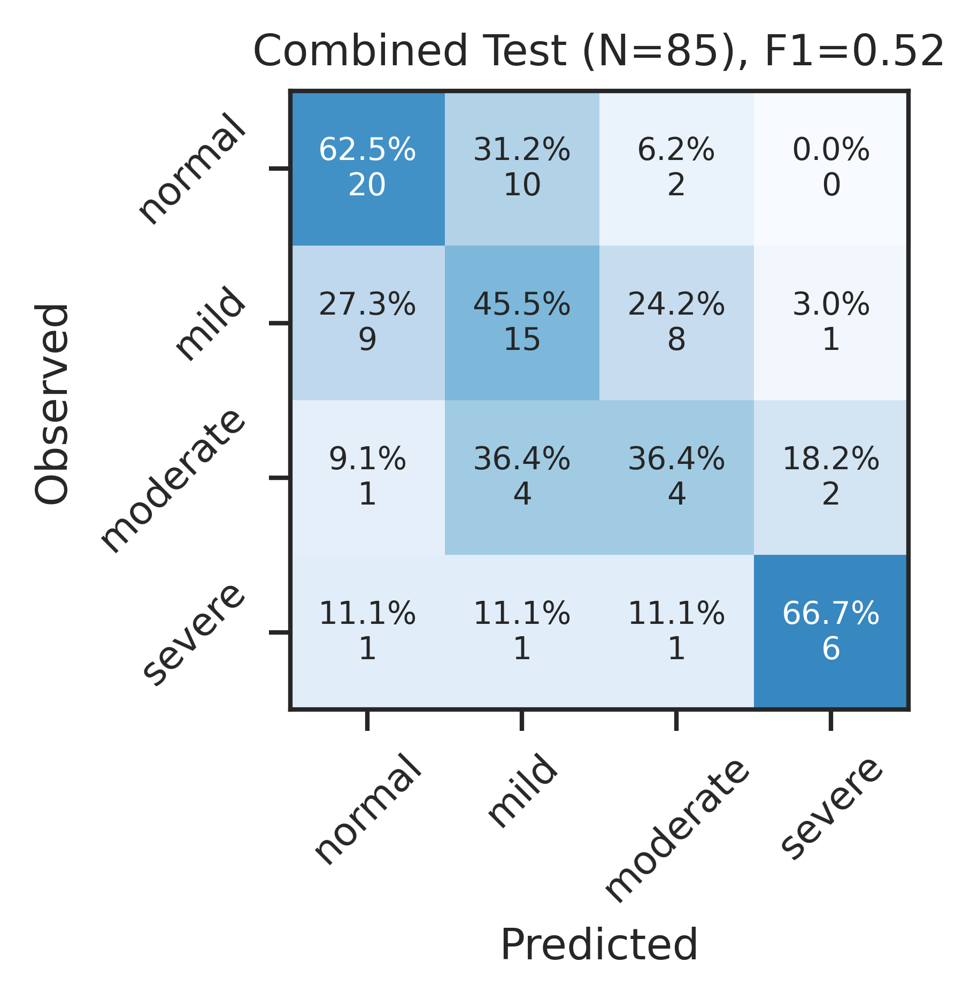

In [22]:
#Final model benchmark tests
sns.set_context("paper")
sns.set_style('ticks')
matplotlib.rcParams['font.size'] = 7
matplotlib.rcParams['font.family'] = 'sans-serif'

ln = ["normal", "mild", "moderate", "severe"]
seed = 0
all_features = True
# top_features = list(feature_importance.Feature)
rf = RandomForestClassifier(
    n_estimators=2000,
    max_depth=10,
    min_samples_leaf=5,
    min_samples_split=3,
    max_features=3,
    max_samples=0.3,
    class_weight='balanced_subsample',
    random_state=seed,
    n_jobs=-1,
)

# Train on val split from test set outputs and train set outputs
total_train = pd.concat([apnea_val, apnea_train_results])
y_train = total_train['OSA severity']
x_train = total_train.drop(columns=['subject', 'dataset', 'AHI', 'OSA severity'])
if all_features:
    sleep_train = pd.concat([sleep_val, sleep_train_results]).drop(columns=['subject', 'dataset', 'AHI'])
    interact_train = pd.concat([interaction_val, interaction_train_results]).drop(columns=['subject', 'dataset'])
    x_train = pd.concat([x_train, sleep_train, interact_train], axis=1)

rf = rf.fit(x_train, y_train)
imp = rf.feature_importances_

# Test on internal test
y_test_internal = apnea_test['OSA severity']
x_test_internal = apnea_test.drop(columns=['subject', 'dataset', 'AHI', 'OSA severity'])
if all_features:
    sleep_test_internal = sleep_test.drop(columns=['subject', 'dataset', 'AHI'])
    interact_test_internal = interaction_test.drop(columns=['subject', 'dataset'])
    x_test_internal = pd.concat([x_test_internal, sleep_test_internal, interact_test_internal], axis=1)

# Predict
y_hat_internal = rf.predict(x_test_internal)#[top_features])

# Test on external test
y_test_external = apnea_external_test_results['OSA severity']
x_test_external = apnea_external_test_results.drop(columns=['subject', 'dataset', 'AHI', 'OSA severity'])
if all_features:
    sleep_test_external = sleep_external_test_results.drop(columns=['subject', 'dataset', 'AHI'])
    interact_test_external = interaction_external_test_results.drop(columns=['subject', 'dataset'])
    x_test_external = pd.concat([x_test_external, sleep_test_external, interact_test_external], axis=1)

y_hat_external = rf.predict(x_test_external)#[top_features])

# metrics
f1_internal = f1_score(y_test_internal, y_hat_internal, average=None,zero_division=np.nan, labels=[0,1,2,3])
precision_internal = precision_score(y_test_internal, y_hat_internal,average=None,zero_division=np.nan, labels=[0,1,2,3])
recall_internal = recall_score(y_test_internal, y_hat_internal,average=None,zero_division=np.nan, labels=[0,1,2,3])

print(f'F1 internal: {f1_internal}')
print(f'Recall internal: {precision_internal}')
print(f'Precision internal: {recall_internal}\n')

# metrics
f1_external = f1_score(y_test_external, y_hat_external, average=None,zero_division=np.nan, labels=[0,1,2,3])
precision_external = precision_score(y_test_external, y_hat_external,average=None,zero_division=np.nan, labels=[0,1,2,3])
recall_external = recall_score(y_test_external, y_hat_external,average=None,zero_division=np.nan, labels=[0,1,2,3])

print(f'F1 external: {f1_external}')
print(f'Recall external: {precision_external}')
print(f'Precision external: {recall_external}\n')

y_combined = np.concatenate([y_test_external,y_test_internal])
y_hat_combined = np.concatenate([y_hat_external,y_hat_internal])
combined_f1 = f1_score(y_combined, y_hat_combined, average=None,zero_division=np.nan, labels=[0,1,2,3])
### PLOTS

fig, axes = plt.subplots(1,1,dpi=600, figsize=(3.5,3), layout='constrained')#,sharey=True, sharex=True)
## Confusion Matrix Combined
cm_abs = confusion_matrix(y_combined, y_hat_combined, normalize=None)
cm_norm = cm_abs/cm_abs.sum(axis=1, keepdims=True)
# Create combined annotation matrix
annot = np.empty_like(cm_abs).astype(str)
for r in range(cm_abs.shape[0]):
    for c in range(cm_abs.shape[1]):
        annot[r, c] = f"{cm_norm[r, c]*100:.1f}%\n{cm_abs[r, c]}"
ax = sns.heatmap(
    cm_norm, annot=annot, fmt="", cmap="Blues", vmin=0, vmax=1, ax=axes,
    square=True, cbar=False, #linewidths=0.2, linecolor='black', clip_on=False,
    xticklabels=ln, yticklabels=ln,# annot_kws={'fontsize':7}
)
for _, spine in ax.spines.items():
    spine.set_visible(True)

ax.tick_params(rotation = 45)
ax.set_ylabel('Observed')
for label in ax.get_yticklabels():
    label.set_verticalalignment('center')

ax.set_xlabel('Predicted')
for label in ax.get_xticklabels():
    label.set_horizontalalignment('center')
ax.set_title(f'Combined Test (N={len(y_hat_combined)}), F1={round(combined_f1.mean(0), 2)}')

# fig, axes = plt.subplots(1,2,dpi=600, figsize=(7.1,3.15), layout='constrained')#,sharey=True, sharex=True)
# ## Confusion Matrix internal
# cm_abs = confusion_matrix(y_test_internal, y_hat_internal, normalize=None)
# cm_norm = cm_abs/cm_abs.sum(axis=1, keepdims=True)
# # Create combined annotation matrix
# annot = np.empty_like(cm_abs).astype(str)
# for r in range(cm_abs.shape[0]):
#     for c in range(cm_abs.shape[1]):
#         annot[r, c] = f"{cm_norm[r, c]*100:.1f}%\n{cm_abs[r, c]}"
# ax = sns.heatmap(
#     cm_norm, annot=annot, fmt="", cmap="Blues", vmin=0, vmax=1, ax=axes[0],
#     square=True, cbar=False, #linewidths=0.2, linecolor='black', clip_on=False,
#     xticklabels=ln, yticklabels=ln,# annot_kws={'fontsize':7}
# )
# for _, spine in ax.spines.items():
#     spine.set_visible(True)

# ax.tick_params(rotation = 45)
# ax.set_ylabel('Observed')
# for label in ax.get_yticklabels():
#     label.set_verticalalignment('center')

# ax.set_xlabel('Predicted')
# for label in ax.get_xticklabels():
#     label.set_horizontalalignment('center')
# ax.set_title(f'Internal Test (N={len(y_test_internal)}), F1={round(f1_internal.mean(0), 2)}')


# ## Confusion Matrix external
# cm_abs = confusion_matrix(y_test_external, y_hat_external, normalize=None)
# cm_norm = cm_abs/cm_abs.sum(axis=1, keepdims=True)
# # Create combined annotation matrix
# annot = np.empty_like(cm_abs).astype(str)
# for r in range(cm_abs.shape[0]):
#     for c in range(cm_abs.shape[1]):
#         annot[r, c] = f"{cm_norm[r, c]*100:.1f}%\n{cm_abs[r, c]}"
# ax = sns.heatmap(
#     cm_norm, annot=annot, fmt="", cmap="Blues", vmin=0, vmax=1, ax=axes[1],
#     square=True, cbar=False, #linewidths=0.2, linecolor='black', clip_on=False,
#     xticklabels=ln, yticklabels=ln,# annot_kws={'fontsize':7}
# )
# for _, spine in ax.spines.items():
#     spine.set_visible(True)

# ax.tick_params(rotation = 45)
# ax.set_ylabel('Observed')
# for label in ax.get_yticklabels():
#     label.set_verticalalignment('center')

# ax.set_xlabel('Predicted')
# for label in ax.get_xticklabels():
#     label.set_horizontalalignment('center')
# ax.set_title(f'External Test (N={len(y_test_external)}), F1={round(f1_external.mean(0), 2)}')
# plt.show()


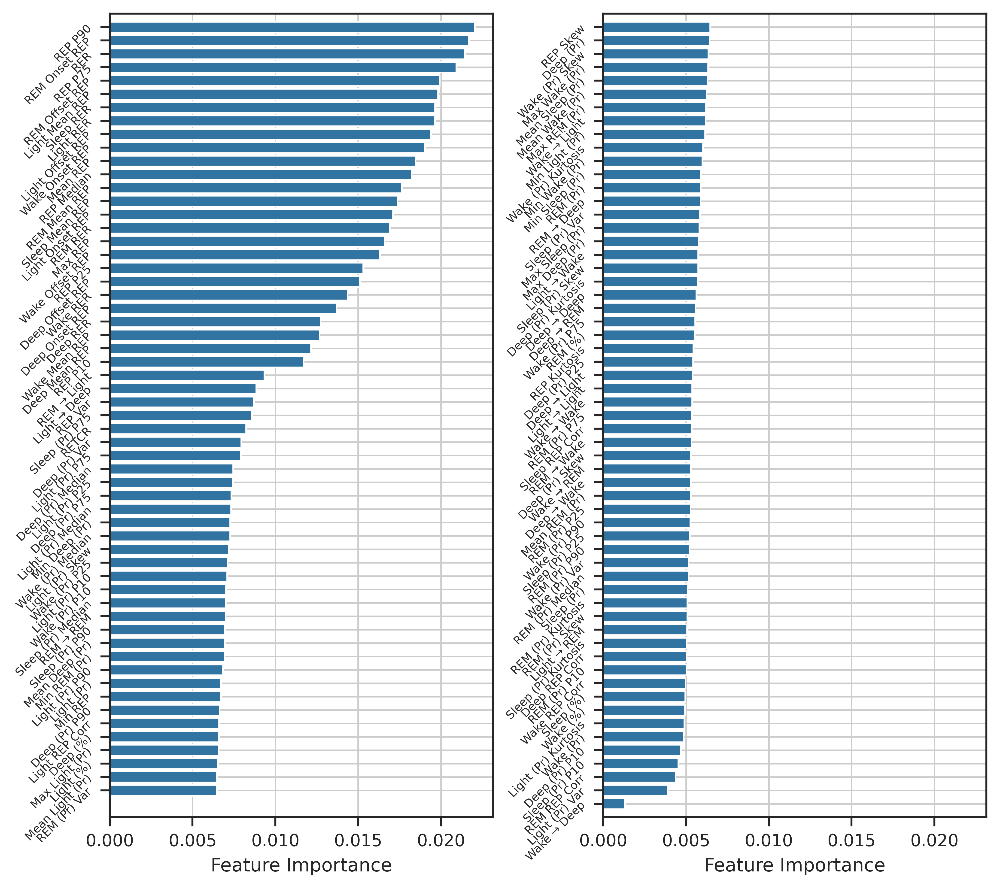

In [23]:

## All Feature Importance
fig, axes = plt.subplots(1,2,dpi=600, figsize=(7.1,6.3), layout='constrained', sharex=True)
df = {
    'Feature Importance': np.array(imp),
    'Feature': x_train.columns,
}
df = pd.DataFrame(df).sort_values('Feature Importance', ascending=False)#.iloc[:20, :] # Top 15 features

ax = sns.barplot(df.iloc[:len(df)//2], y='Feature', x='Feature Importance', ax=axes[0], edgecolor=None)
# ax.errorbar(data=df.iloc[:len(df)//2], y='Feature', x='Feature Importance', xerr='SD', ls='', lw=1.5, color='black')
ax.tick_params('y',rotation = 45, labelsize=6)
for label in ax.get_yticklabels():
    label.set_horizontalalignment('right')
ax.set_ylim(len(df)//2+1, -1)
ax.set_ylabel('')
ax.grid()

ax = sns.barplot(df.iloc[len(df)//2:], y='Feature', x='Feature Importance', ax=axes[1], edgecolor=None)
# ax.errorbar(data=df.iloc[len(df)//2:], y='Feature', x='Feature Importance', xerr='SD', ls='', lw=1.5, color='black')
ax.tick_params('y',rotation = 45, labelsize=6)
for label in ax.get_yticklabels():
    label.set_horizontalalignment('right')
ax.set_ylim(len(df)//2+1, -1)
ax.set_ylabel('')
ax.grid()

# fig.suptitle(f'{model_name}, F1={round(f1_mean.mean(),2)} ± {round(f1_macro_std,2)}')
plt.show()

In [1]:
import skl2onnx

RE + Sleep, r2=0.23 ± 0.26


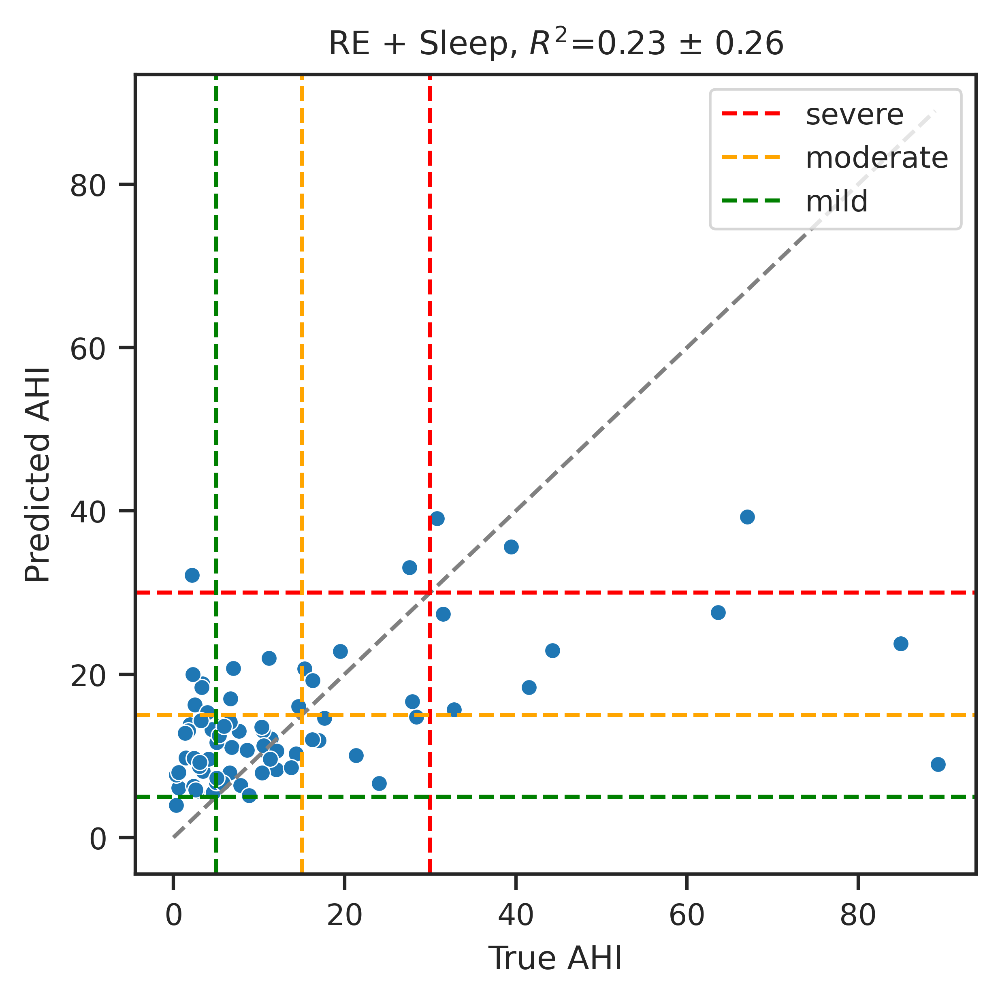

In [ ]:
# Regression model testing
sns.set_context("paper")
sns.set_style('ticks')
matplotlib.rcParams['font.size'] = 7
matplotlib.rcParams['font.family'] = 'sans-serif'

model_name = 'RE + Sleep'
ln = ["normal", "mild", "moderate", "severe"]
seed = 1
# Train on full training set vs only training-test
use_train = True
use_sleep_feat = True
use_interact = True

rf = RandomForestRegressor(
    n_estimators=2000,
    max_depth=10,
    # criterion='absolute_error',
    min_samples_leaf=1,
    min_samples_split=3,
    max_features=3,
    max_samples=0.3,
    random_state=seed,
    n_jobs=-1,
)
rkf = RepeatedStratifiedKFold(n_splits=5, n_repeats=1, random_state=seed)

imp = []
y_hat_all = []
y_all = []
r2 = []

for train_idx, test_idx in rkf.split(apnea_val['OSA severity'], apnea_val['OSA severity']):
    # Train on val split from test result outputs
    y_train = apnea_val.loc[train_idx, 'AHI']
    x_train = apnea_val.drop(columns=['subject', 'dataset', 'AHI', 'OSA severity']).loc[train_idx,:]
    c_train = sleep_val.drop(columns=['subject', 'dataset', 'AHI']).loc[train_idx,:]
    interact_train = interaction_val.drop(columns=['subject', 'dataset']).loc[train_idx,:]

    if use_train:
        # Train on training set output
        y_train2 = apnea_train_results['AHI']
        x_train2 = apnea_train_results.drop(columns=['subject', 'dataset', 'AHI', 'OSA severity'])
        c_train2 = sleep_train_results.drop(columns=['subject', 'dataset', 'AHI'])
        interact_train2 = interaction_train_results.drop(columns=['subject', 'dataset'])

        y_train = pd.concat([y_train,y_train2])
        x_train = pd.concat([x_train,x_train2])
        c_train = pd.concat([c_train,c_train2])
        interact_train = pd.concat([interact_train, interact_train2])

    # Evaluate on val split from test result outputs
    y_test = apnea_val.loc[test_idx, 'AHI']
    x_test = apnea_val.drop(columns=['subject', 'dataset', 'AHI', 'OSA severity']).loc[test_idx,:]
    c_test = sleep_val.drop(columns=['subject', 'dataset', 'AHI']).loc[test_idx,:]
    interact_test = interaction_val.drop(columns=['subject', 'dataset']).loc[test_idx,:]

    if use_sleep_feat:
        x_train = pd.concat([x_train,c_train],axis=1)
        x_test = pd.concat([x_test,c_test],axis=1)
    
    if use_interact:
        x_train = pd.concat([x_train,interact_train],axis=1)
        x_test = pd.concat([x_test,interact_test],axis=1)    

    # inverse frequency weights
    # bins = [0, 5, 15, 30, np.inf]
    # OSA_sev = np.digitize(y_train, bins=bins, right=False) - 1
    # freqs = np.bincount(OSA_sev, minlength=len(bins))  # frequency per bin
    # weights = 1.0 / freqs[OSA_sev]
    # weights /= weights.mean()
    # weights = np.ones(len(x_train))
    # weights[x_train['dataset']=='stages'] = 0

    rf = rf.fit(x_train, y_train)#, sample_weight = (1 - (y_train/y_train.max()))*100)
    
    # Predict and inverse transform
    y_hat = rf.predict(x_test)

    # imp.append(rf.coef_)
    imp.append(rf.feature_importances_)
    y_hat_all.extend(y_hat)
    y_all.extend(y_test)
    r2.append(r2_score(y_test, y_hat))

r2_mean, r2_std = np.mean(r2), np.std(r2)
print(f'{model_name}, r2={round(r2_mean,2)} ± {round(r2_std,2)}')

fig, axes = plt.subplots(1,1,dpi=600, figsize=(4,4), layout='constrained')#,sharey=True, sharex=True)

## REGPLOT
ax = sns.scatterplot(x=y_all, y=y_hat_all, ax=axes)
# sns.regplot(x=y_all, y=y_hat_all, ax=ax, scatter=False, color='black')
ax.plot(np.arange(np.max(y_all)), np.arange(np.max(y_all)), ls='--', color='gray')
ax.set_title(f'{model_name}, $R^2$={round(r2_mean,2)} ± {round(r2_std,2)}')
ax.set_xlabel('True AHI')
ax.set_ylabel('Predicted AHI')

ax.axhline(30, ls='--', color='red', label='severe')
ax.axvline(30, ls='--', color='red')
ax.axhline(15, ls='--', color='orange', label='moderate')
ax.axvline(15, ls='--', color='orange')
ax.axhline(5, ls='--', color='green', label='mild')
ax.axvline(5, ls='--', color='green')
ax.legend(loc='upper right')
plt.show()


r2 internal: 0.46326167846815647

r2 external: 0.2474016192557461



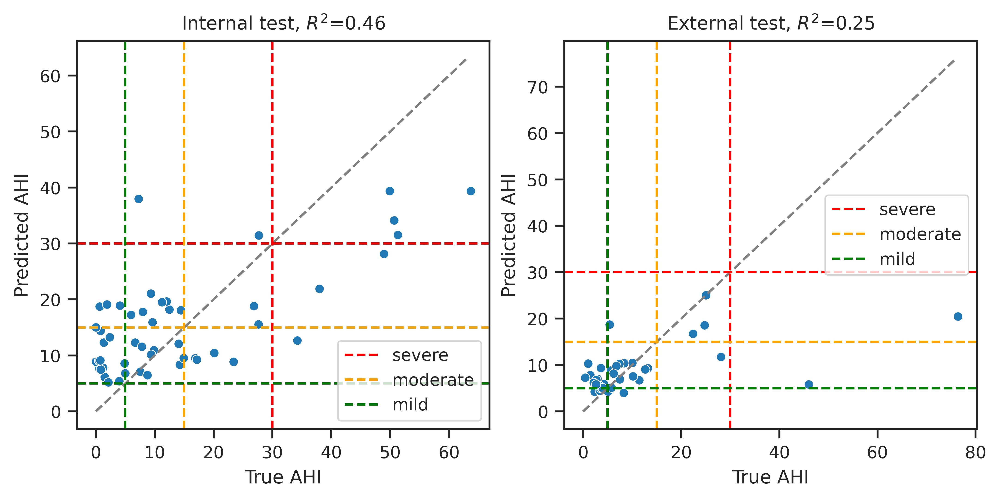

In [ ]:
#Final regression model benchmark tests
sns.set_context("paper")
sns.set_style('ticks')
matplotlib.rcParams['font.size'] = 7
matplotlib.rcParams['font.family'] = 'sans-serif'

ln = ["normal", "mild", "moderate", "severe"]
seed = 0
all_features = True

rf = RandomForestRegressor(
    n_estimators=2000,
    max_depth=10,
    min_samples_leaf=2,
    min_samples_split=3,
    max_features=3,
    max_samples=0.3,
    random_state=seed,
    n_jobs=-1,
)

# Train on val split from test set outputs and train set outputs
total_train = pd.concat([apnea_val, apnea_train_results])
y_train = total_train['AHI']
x_train = total_train.drop(columns=['subject', 'dataset', 'AHI', 'OSA severity'])
if all_features:
    sleep_train = pd.concat([sleep_val, sleep_train_results]).drop(columns=['subject', 'dataset', 'AHI'])
    interact_train = pd.concat([interaction_val, interaction_train_results]).drop(columns=['subject', 'dataset'])
    x_train = pd.concat([x_train, sleep_train, interact_train], axis=1)

rf = rf.fit(x_train, y_train)
imp = rf.feature_importances_

# Test on internal test
y_test_internal = apnea_test['AHI']
x_test_internal = apnea_test.drop(columns=['subject', 'dataset', 'AHI', 'OSA severity'])
if all_features:
    sleep_test_internal = sleep_test.drop(columns=['subject', 'dataset', 'AHI'])
    interact_test_internal = interaction_test.drop(columns=['subject', 'dataset'])
    x_test_internal = pd.concat([x_test_internal, sleep_test_internal, interact_test_internal], axis=1)

# Predict
y_hat_internal = rf.predict(x_test_internal)

# Test on external test
y_test_external = apnea_external_test_results['AHI']
x_test_external = apnea_external_test_results.drop(columns=['subject', 'dataset', 'AHI', 'OSA severity'])
if all_features:
    sleep_test_external = sleep_external_test_results.drop(columns=['subject', 'dataset', 'AHI'])
    interact_test_external = interaction_external_test_results.drop(columns=['subject', 'dataset'])
    x_test_external = pd.concat([x_test_external, sleep_test_external, interact_test_external], axis=1)

y_hat_external = rf.predict(x_test_external)

# metrics
r2_internal = r2_score(y_test_internal, y_hat_internal)
print(f'r2 internal: {r2_internal}\n')

r2_external = r2_score(y_test_external, y_hat_external)
print(f'r2 external: {r2_external }\n')

### PLOTS
fig, axes = plt.subplots(1,2,dpi=600, figsize=(7.1,3.5), layout='constrained')#,sharey=True, sharex=True)
## regplot internal
ax = sns.scatterplot(x=y_test_internal, y = y_hat_internal, ax=axes[0])
ax.plot(np.arange(np.max(y_test_internal)), np.arange(np.max(y_test_internal)), ls='--', color='gray')
ax.set_title(f'Internal test, $R^2$={round(r2_internal,2)}')
ax.set_xlabel('True AHI')
ax.set_ylabel('Predicted AHI')

ax.axhline(30, ls='--', color='red', label='severe')
ax.axvline(30, ls='--', color='red')
ax.axhline(15, ls='--', color='orange', label='moderate')
ax.axvline(15, ls='--', color='orange')
ax.axhline(5, ls='--', color='green', label='mild')
ax.axvline(5, ls='--', color='green')
ax.legend()

# regplot external
ax = sns.scatterplot(x=y_test_external, y=y_hat_external, ax=axes[1])
ax.plot(np.arange(np.max(y_test_external)), np.arange(np.max(y_test_external)), ls='--', color='gray')
ax.set_title(f'External test, $R^2$={round(r2_external,2)}')
ax.set_xlabel('True AHI')
ax.set_ylabel('Predicted AHI')

ax.axhline(30, ls='--', color='red', label='severe')
ax.axvline(30, ls='--', color='red')
ax.axhline(15, ls='--', color='orange', label='moderate')
ax.axvline(15, ls='--', color='orange')
ax.axhline(5, ls='--', color='green', label='mild')
ax.axvline(5, ls='--', color='green')
ax.legend()
plt.show()